# Business Problem:

- Prediction of various Forest cover types from the aforementioned categories given in the data using Cartographic variables as the target variable to get accurate predictions viable for state, private and federal agencies.
- Which one among Elevation, Slope & Aspect actually turn out to improve predictions in the best possible way?


# Understanding the variables

- The azimuth is the angular direction of the sun, measured from north in clockwise degrees from 0 to 360. An azimuth of 90 degrees is east. The default azimuth is 315 degrees (NW).

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, LabelEncoder, PowerTransformer
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB

from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, KFold, cross_val_score, StratifiedKFold, cross_val_predict, GroupKFold
from sklearn.metrics import classification_report, cohen_kappa_score, confusion_matrix, f1_score
from xgboost.sklearn import XGBClassifier
import warnings
warnings.filterwarnings('ignore')

from statsmodels.stats.multicomp import pairwise_tukeyhsd


In [0]:
#from google.colab import drive
#drive.mount('/content/drive')

path = '/content/drive/My Drive/Colab Notebooks/covtype_rem_dummies.csv'
df = pd.read_csv('covtype_rem_dummies.csv')

In [0]:
df.head()

,Unnamed: 0,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Forest_Cover_Type_designation,Soil_types,Winderness_types
0,0,2596,51,3,258,0,510,221,232,148,6279,5,Soil_Type_29,Wilderness_Area_1
1,1,2590,56,2,212,-6,390,220,235,151,6225,5,Soil_Type_29,Wilderness_Area_1
2,2,2804,139,9,268,65,3180,234,238,135,6121,2,Soil_Type_12,Wilderness_Area_1
3,3,2785,155,18,242,118,3090,238,238,122,6211,2,Soil_Type_30,Wilderness_Area_1
4,4,2595,45,2,153,-1,391,220,234,150,6172,5,Soil_Type_29,Wilderness_Area_1


In [0]:
df = df.drop(columns='Unnamed: 0')

In [0]:
df['Forest_Cover_Type_designation'].value_counts(normalize =True)*100

2    48.759922
1    36.460521
3     6.153746
7     3.530048
6     2.989095
5     1.633873
4     0.472796
Name: Forest_Cover_Type_designation, dtype: float64

Dropping all classes having a total of 5% data and keeping the rest for prediction.

In [0]:
df = df[(df['Forest_Cover_Type_designation'] == 1) | (df['Forest_Cover_Type_designation'] == 2) | (df['Forest_Cover_Type_designation'] == 3) | (df['Forest_Cover_Type_designation'] == 7)]




# Descriptive Statistics

In [0]:
df.shape

(551405, 13)

In [0]:
df.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Forest_Cover_Type_designation,Soil_types,Winderness_types
2,2804,139,9,268,65,3180,234,238,135,6121,2,Soil_Type_12,Wilderness_Area_1
3,2785,155,18,242,118,3090,238,238,122,6211,2,Soil_Type_30,Wilderness_Area_1
5,2579,132,6,300,-15,67,230,237,140,6031,2,Soil_Type_29,Wilderness_Area_1
11,2886,151,11,371,26,5253,234,240,136,4051,2,Soil_Type_30,Wilderness_Area_1
12,2742,134,22,150,69,3215,248,224,92,6091,2,Soil_Type_30,Wilderness_Area_1


In [0]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Elevation,551405.0,2983.002878,261.367213,1859.0,2844.0,3011.0,3172.0,3858.0
Aspect,551405.0,155.247259,111.469500,0.0,58.0,127.0,258.0,360.0
Slope,551405.0,13.882217,7.380246,0.0,8.0,13.0,18.0,66.0
Horizontal_Distance_To_Hydrology,551405.0,274.671461,214.173000,0.0,108.0,228.0,391.0,1397.0
Vertical_Distance_To_Hydrology,551405.0,46.403671,58.616287,-173.0,7.0,29.0,68.0,601.0
Horizontal_Distance_To_Roadways,551405.0,2415.876213,1563.967373,0.0,1155.0,2087.0,3416.0,7117.0
Hillshade_9am,551405.0,212.478233,26.313353,0.0,199.0,218.0,231.0,254.0
Hillshade_Noon,551405.0,223.848857,19.329145,0.0,214.0,226.0,238.0,254.0
Hillshade_3pm,551405.0,142.856867,37.567787,0.0,120.0,143.0,168.0,254.0
Horizontal_Distance_To_Fire_Points,551405.0,2021.939172,1334.629172,0.0,1060.0,1756.0,2592.0,7173.0


`'Wilderness_Area_1' : 'Rawah', 'Wilderness_Area_3':'Comanche_Peak', 'Wilderness_Area_4':'Cache_la_Poudre',  'Wilderness_Area_2':'Neota'`

In [0]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 551405 entries, 2 to 581011
Data columns (total 13 columns):
Elevation                             551405 non-null int64
Aspect                                551405 non-null int64
Slope                                 551405 non-null int64
Horizontal_Distance_To_Hydrology      551405 non-null int64
Vertical_Distance_To_Hydrology        551405 non-null int64
Horizontal_Distance_To_Roadways       551405 non-null int64
Hillshade_9am                         551405 non-null int64
Hillshade_Noon                        551405 non-null int64
Hillshade_3pm                         551405 non-null int64
Horizontal_Distance_To_Fire_Points    551405 non-null int64
Forest_Cover_Type_designation         551405 non-null int64
Soil_types                            551405 non-null object
Winderness_types                      551405 non-null object
dtypes: int64(11), object(2)
memory usage: 58.9+ MB


Our data is having 11 integer columns and 2 object columns

In [0]:
num = df.select_dtypes(include='int')
num.drop(columns = 'Forest_Cover_Type_designation', inplace = True)
num.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points
2,2804,139,9,268,65,3180,234,238,135,6121
3,2785,155,18,242,118,3090,238,238,122,6211
5,2579,132,6,300,-15,67,230,237,140,6031
11,2886,151,11,371,26,5253,234,240,136,4051
12,2742,134,22,150,69,3215,248,224,92,6091


In [0]:
cat = df.select_dtypes(include='object')
le = LabelEncoder()
for i in cat.columns:
    cat[i] = le.fit_transform(cat[i])
cat['Forest_Cover_Type_designation'] = df['Forest_Cover_Type_designation']
cat.head()

,Soil_types,Winderness_types,Forest_Cover_Type_designation
2,3,0,2
3,22,0,2
5,20,0,2
11,22,0,2
12,22,0,2


In [0]:
'''def cramers_stat(confusion_matrix): # Just Cramers 
    chi2 = stats.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    return np.sqrt(chi2 / (n*(min(confusion_matrix.shape)-1)))''' 

'def cramers_stat(confusion_matrix): # Just Cramers \n    chi2 = stats.chi2_contingency(confusion_matrix)[0]\n    n = confusion_matrix.sum()\n    return np.sqrt(chi2 / (n*(min(confusion_matrix.shape)-1)))'

Cramér's V can be a heavily biased estimator of its population counterpart and will tend to overestimate the strength of association. A bias correction, using the above notation, is given by:

In [0]:
import scipy.stats as stats
def cramers_v(x, y): # After Applying Cramers Correction
    """ Calculate Cramers V Corrected statistic for categorial-categorial association.
        uses correction from Bergsma and Wicher, 
        Journal of the Korean Statistical Society 42 (2013): 323-328
    """
    result=-1
   
    confusion_matrix = pd.crosstab(x,y)

    if confusion_matrix.shape[0]==2:
        correct=False
    else:
        correct=True

    chi2 = stats.chi2_contingency(confusion_matrix, correction = correct)[0] 
    # Pearson's chi-squared statistic value used here

    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    #print(phi2corr)
    rcorr = r-((r-1)**2)/(n-1)
    kcorr = k-((k-1)**2)/(n-1)
    result = np.sqrt( phi2corr / min( (kcorr-1), (rcorr-1) ) )
    return round(result, 6)

https://en.wikipedia.org/wiki/Cram%C3%A9r%27s_V

- Cramér's V (sometimes referred to as Cramér's phi and denoted as φc) is a measure of association between two nominal variables, giving a value between 0 and +1 (inclusive). It is based on Pearson's chi-squared statistic and was published by Harald Cramér in 1946

### Chisquare Test Hypothesis

- H0: the two samples are independent.
- H1: there is a dependency between the samples.

Also, we will be using Cramér's V Corrected Value as a measure to quantify the association among various categorical variables only.

In [0]:
confusion_matrix = pd.crosstab(cat['Winderness_types'], cat['Forest_Cover_Type_designation'])
stats.chi2_contingency(confusion_matrix)[1], cramers_v(df['Winderness_types'], df['Forest_Cover_Type_designation'])

(0.0, 0.425539)

In [0]:
confusion_matrix = pd.crosstab(cat['Soil_types'], cat['Forest_Cover_Type_designation'])
stats.chi2_contingency(confusion_matrix)[1], cramers_v(df['Soil_types'], df['Forest_Cover_Type_designation'])

(0.0, 0.606878)

In [0]:
confusion_matrix = pd.crosstab(cat['Soil_types'], cat['Winderness_types'])
stats.chi2_contingency(confusion_matrix)[1], cramers_v(df['Winderness_types'], df['Soil_types'])

(0.0, 0.684902)

Therefore, there is a dependency among all the three categorical Columns.

- According to Cramér's V Corrected Value Wilderness_types and Soil_types are highly correlated

# Univariate Analysis

In [0]:
def perc_cal(i):
    return((df[i].value_counts()/df[i].value_counts().sum())*100)

In [0]:
df['Forest_Cover_Type_designation'] = df['Forest_Cover_Type_designation'].map({1:'Spruce/Fir', 2:'Lodgepole Pine', 3:'Ponderosa Pine', 7:'Krummholz'})

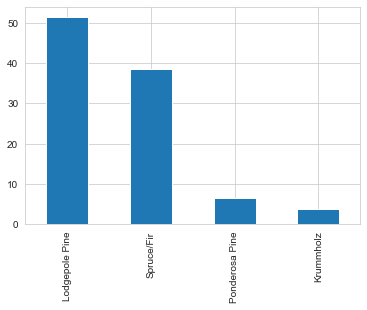

In [0]:
(df['Forest_Cover_Type_designation'].value_counts(normalize=True)*100).plot(kind='bar')

## IMAGE

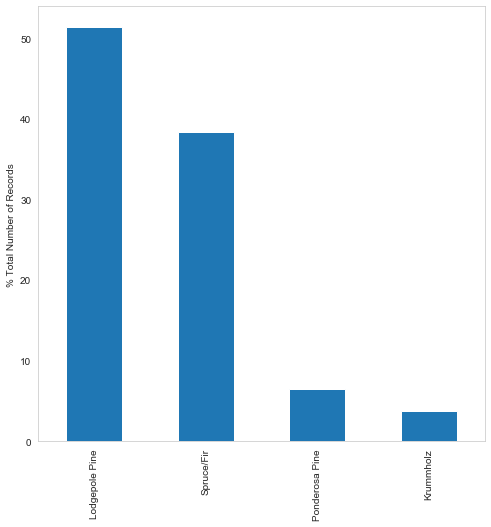

In [0]:
plt.figure(figsize=(8,8))
perc_cal('Forest_Cover_Type_designation').plot(kind='bar')
plt.ylabel('% Total Number of Records')
plt.savefig('Target_dist.png', dpi=600)
plt.grid()
plt.show()

In [0]:
perc_cal('Forest_Cover_Type_designation')

2    51.378025
1    38.418223
3     6.484163
7     3.719589
Name: Forest_Cover_Type_designation, dtype: float64

Considering this to be a multiclass problem the number of observations in one class or more than one class turns out to be significantly lesser than other classes. 

Although, both the minority as well as the majority class seem to have enough observations for them to represent their respective classes in our data.

## Looking at the number of instances of other `Categorical` variables.

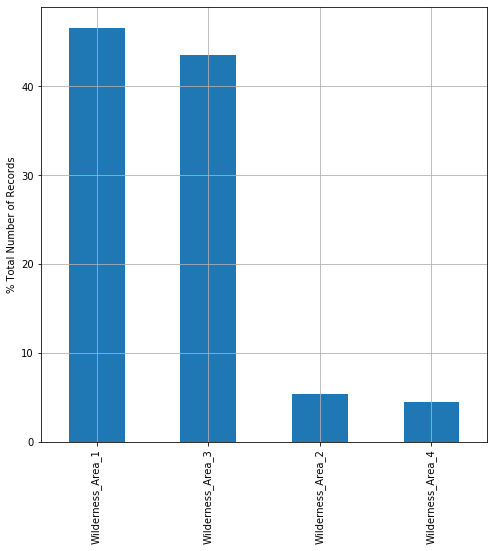

In [0]:
plt.figure(figsize=(8,8))
perc_cal('Winderness_types').plot(kind='bar')
plt.ylabel('% Total Number of Records')
plt.savefig('Wilderness_dist.png', dpi=600)
plt.grid()
plt.show()

In [0]:
perc_cal('Winderness_types')

Wilderness_Area_1    46.610930
Wilderness_Area_3    43.529892
Wilderness_Area_2     5.419610
Wilderness_Area_4     4.439568
Name: Winderness_types, dtype: float64

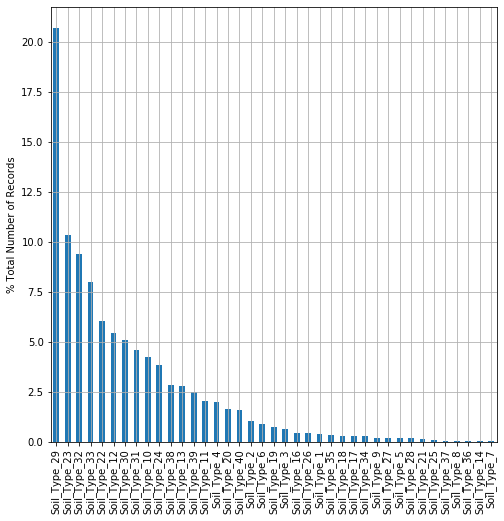

In [0]:
plt.figure(figsize=(8,8))
perc_cal('Soil_types').plot(kind='bar')
plt.ylabel('% Total Number of Records')
plt.savefig('Soil_dist.png', dpi=600)
plt.grid()
plt.show()

In [0]:
perc_cal('Soil_types')

Soil_Type_29    20.695315
Soil_Type_23    10.341582
Soil_Type_32     9.404884
Soil_Type_33     7.997207
Soil_Type_22     6.052357
Soil_Type_12     5.435388
Soil_Type_30     5.088637
Soil_Type_31     4.587191
Soil_Type_10     4.223937
Soil_Type_24     3.821148
Soil_Type_38     2.824240
Soil_Type_13     2.811364
Soil_Type_39     2.503786
Soil_Type_11     2.027004
Soil_Type_4      1.997080
Soil_Type_20     1.618774
Soil_Type_40     1.586855
Soil_Type_2      1.059657
Soil_Type_6      0.889546
Soil_Type_19     0.717077
Soil_Type_3      0.653240
Soil_Type_16     0.454838
Soil_Type_26     0.445589
Soil_Type_1      0.381027
Soil_Type_35     0.342942
Soil_Type_18     0.313563
Soil_Type_17     0.304132
Soil_Type_34     0.285815
Soil_Type_9      0.208014
Soil_Type_27     0.196951
Soil_Type_5      0.175370
Soil_Type_28     0.169385
Soil_Type_21     0.151975
Soil_Type_25     0.085962
Soil_Type_37     0.054044
Soil_Type_8      0.032463
Soil_Type_36     0.021581
Soil_Type_14     0.021037
Soil_Type_7 

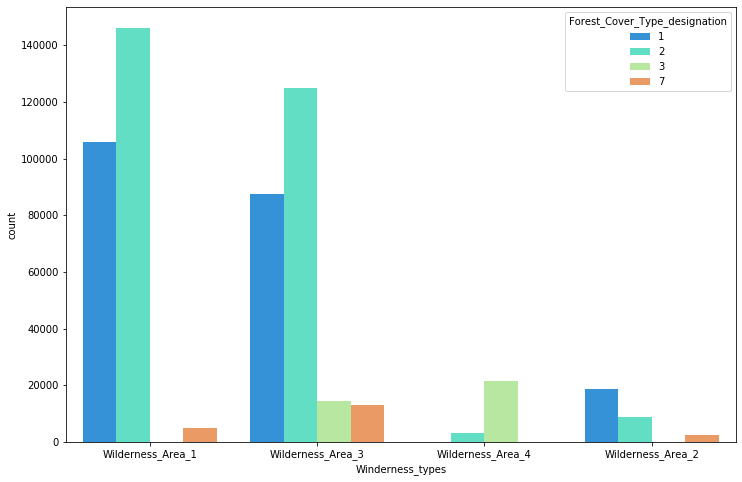

In [0]:
plt.figure(figsize=(12,8))
sns.countplot(x='Winderness_types', hue='Forest_Cover_Type_designation',data=df, palette="rainbow")
#plt.xticks(rotation=90)
plt.show()

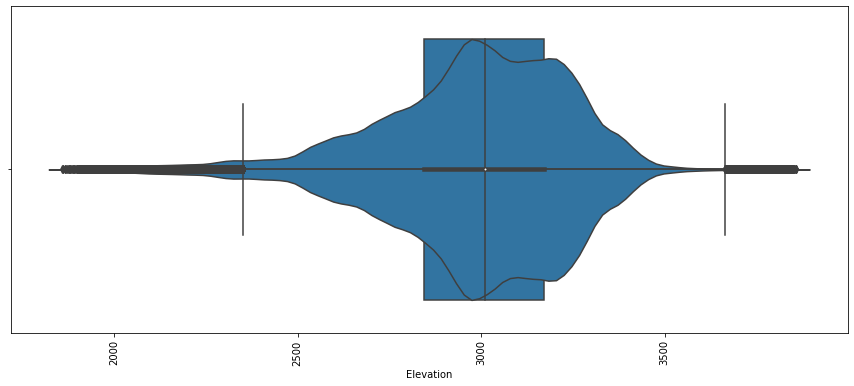

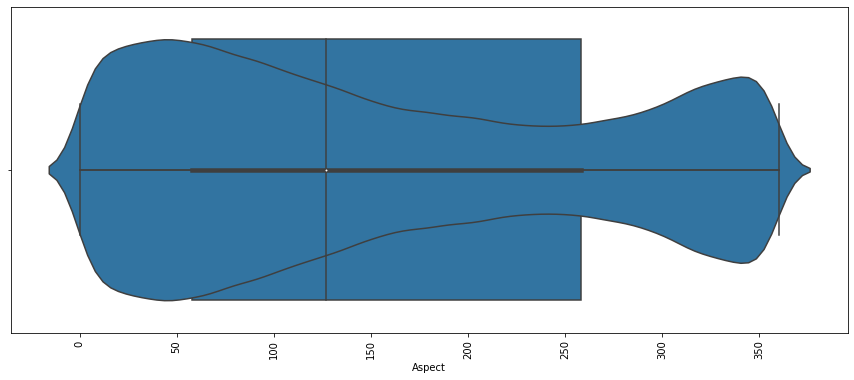

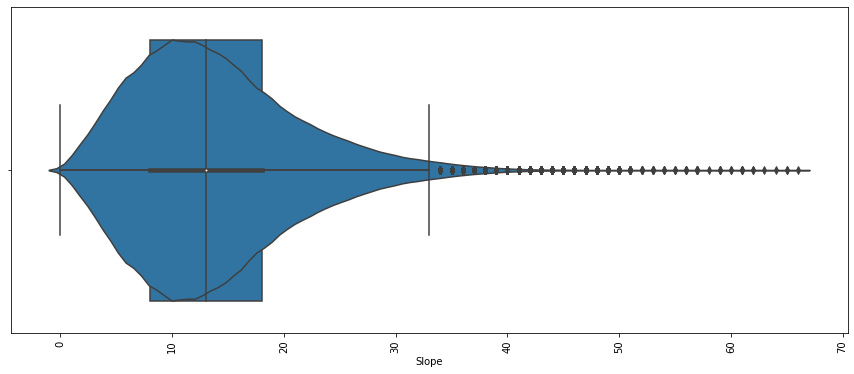

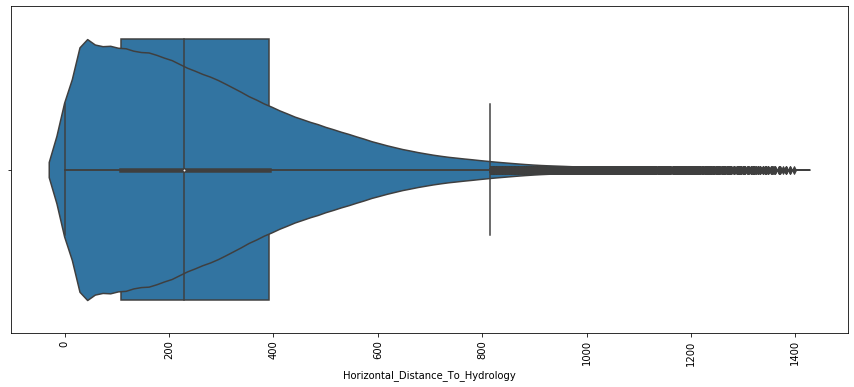

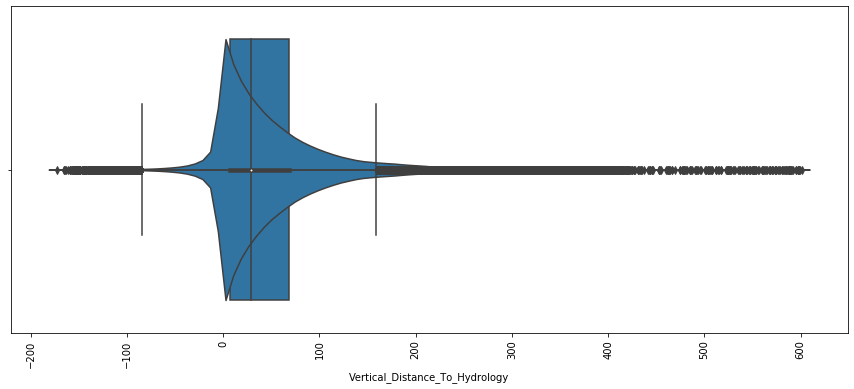

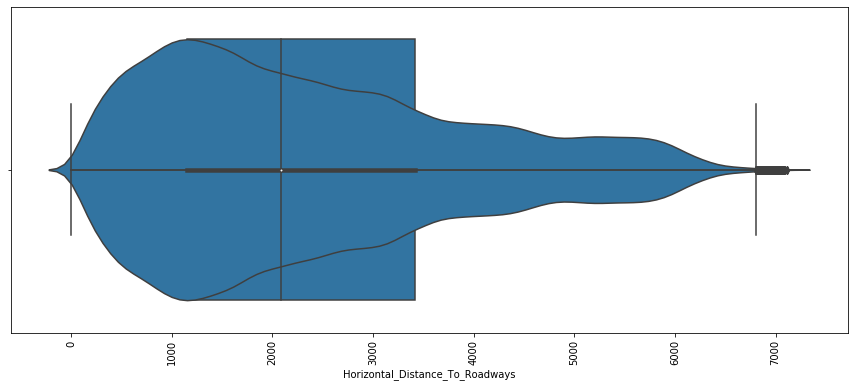

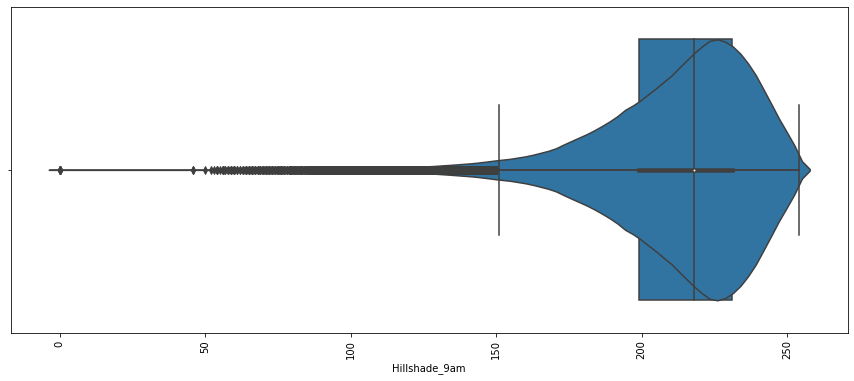

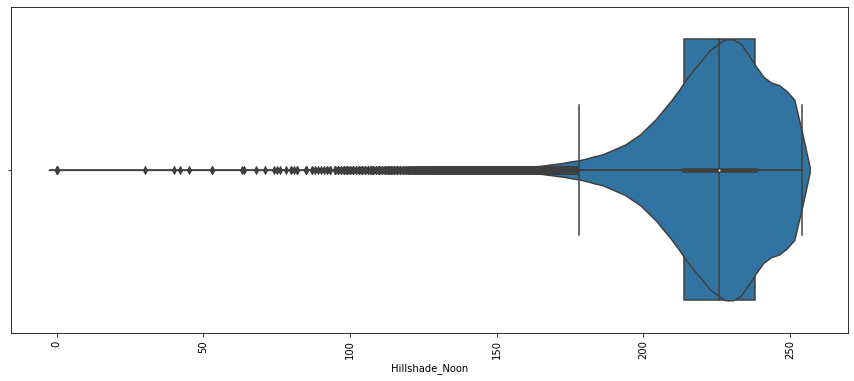

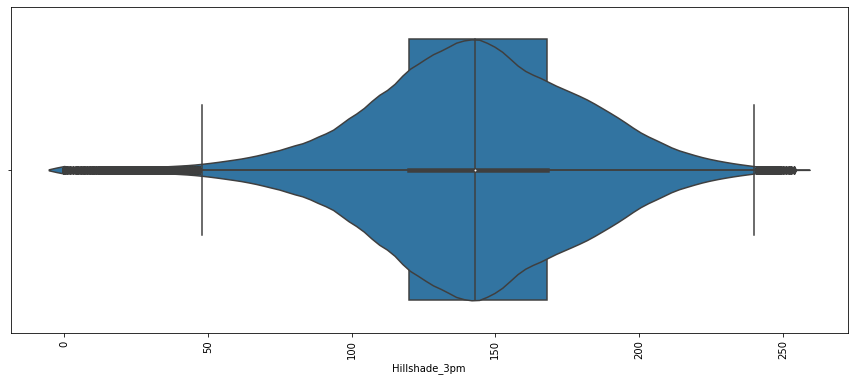

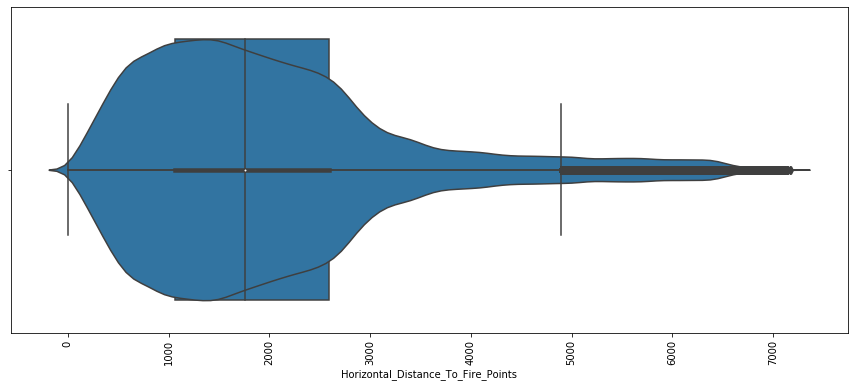

In [0]:
for i in num.columns:
    plt.figure(figsize=(15,6))
    
    sns.violinplot(df[i])
    sns.boxplot(df[i])
    plt.xticks(rotation=90)
    plt.show()

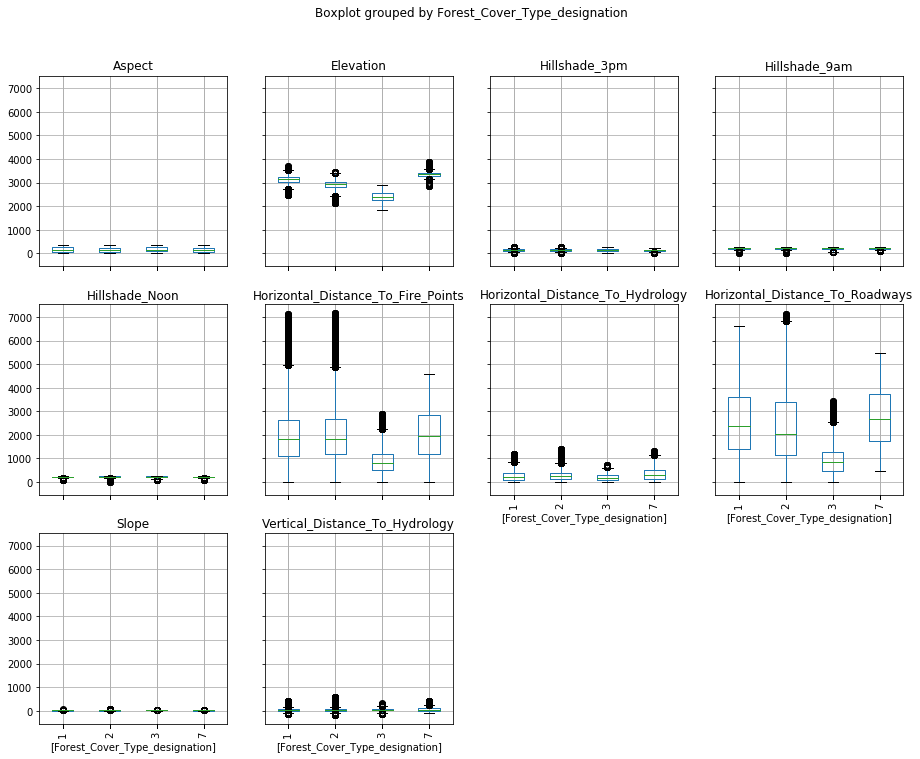

In [0]:

df.boxplot(by='Forest_Cover_Type_designation', figsize=(15,12), grid=True, rot=90, layout=(3,4))
plt.show()

In [0]:
df['Forest_Cover_Type_designation'].value_counts()

2    283301
1    211840
3     35754
7     20510
Name: Forest_Cover_Type_designation, dtype: int64

In [0]:
def allplots(i):
    sns.distplot(df[df['Forest_Cover_Type_designation']==1][i], hist=False, label=1)
    sns.distplot(df[df['Forest_Cover_Type_designation']==2][i], hist=False, label=2)
    sns.distplot(df[df['Forest_Cover_Type_designation']==3][i], hist=False, label=3)



    sns.distplot(df[df['Forest_Cover_Type_designation']==7][i], hist=False, label=7)
    plt.legend()
    plt.show()

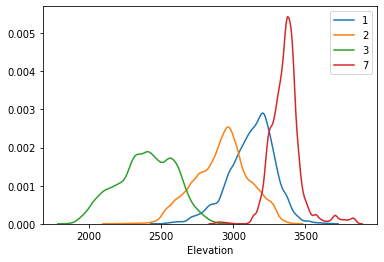

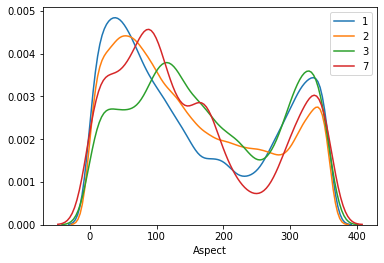

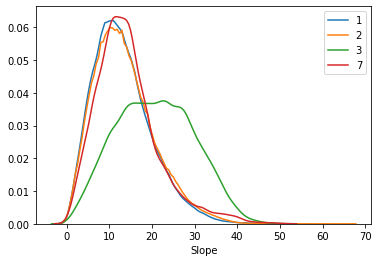

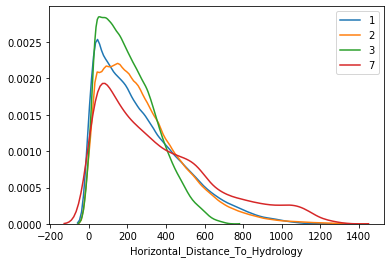

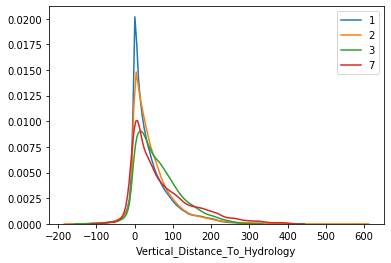

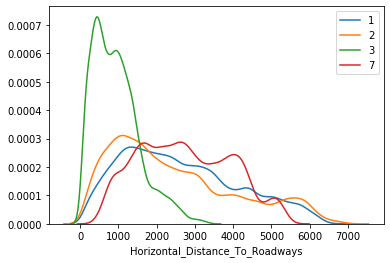

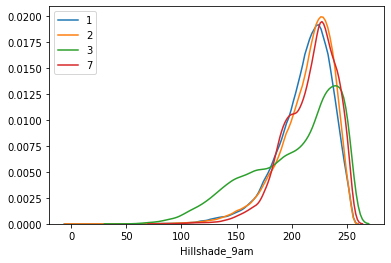

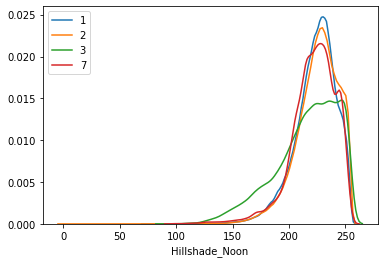

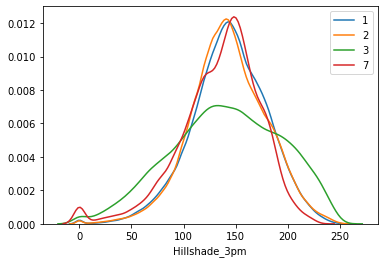

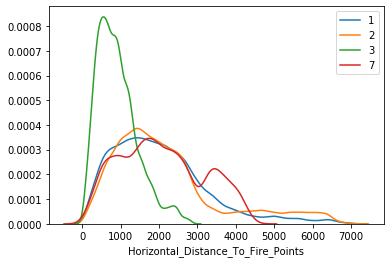

In [0]:
for i in num.columns:    
    allplots(str(i))

Since, all the plots are `multimodal` over here. Therefore, we cannot directly apply any transformation upon this data theoretically.

Since, the EDA is an experimental process. Therefore, we will still be applying various transformation and feature engineering methodologies to this data in order to improve the quality of intelligence in this data and to make better preidictions.

# Statistical Testing upon Continuous Variables w.r.t Target variable

#### Verifying whether these variables are good for predictions or not by performing `One-way ANOVA` among all Forest Cover Types

- H0: the means of the samples are equal.
- H1: one or more of the means of the samples are unequal.

In [0]:
def ftyp(i):
        return(df[df['Forest_Cover_Type_designation'] == i][j])

In [0]:
for j in num.columns:
    
    _, p = stats.f_oneway(ftyp(1), ftyp(2), ftyp(3),ftyp(7))
    print('For the Feature: ', j, '. The p-value has come out to be: ', p)

For the Feature:  Elevation . The p-value has come out to be:  0.0
For the Feature:  Aspect . The p-value has come out to be:  0.0
For the Feature:  Slope . The p-value has come out to be:  0.0
For the Feature:  Horizontal_Distance_To_Hydrology . The p-value has come out to be:  0.0
For the Feature:  Vertical_Distance_To_Hydrology . The p-value has come out to be:  0.0
For the Feature:  Horizontal_Distance_To_Roadways . The p-value has come out to be:  0.0
For the Feature:  Hillshade_9am . The p-value has come out to be:  0.0
For the Feature:  Hillshade_Noon . The p-value has come out to be:  0.0
For the Feature:  Hillshade_3pm . The p-value has come out to be:  2.4012985415743842e-266
For the Feature:  Horizontal_Distance_To_Fire_Points . The p-value has come out to be:  0.0


Since, `all` the `continuous variables` are having one or more than one of the `means among 7 forest cover types` to be `different from each other`.

So, in order to further understand the data we have to perform `Post-Hoc Analysis`



## ADD THESE STAT TESTS

In [0]:

print(pairwise_tukeyhsd(df['Elevation'], df['Forest_Cover_Type_designation']))

  Multiple Comparison of Means - Tukey HSD, FWER=0.05   
group1 group2  meandiff p-adj   lower     upper   reject
--------------------------------------------------------
     1      2 -207.7088 0.001 -208.9952 -206.4225   True
     1      3  -734.135 0.001 -736.6955 -731.5746   True
     1      7  233.2838 0.001  230.0089  236.5587   True
     2      3 -526.4262 0.001 -528.9396 -523.9128   True
     2      7  440.9926 0.001  437.7544  444.2309   True
     3      7  967.4188 0.001  963.4961  971.3415   True
--------------------------------------------------------


##### Thus, statistically all the combinations of Forest_Cover_Type_designation are acting as distinct distributions w.r.t each other for Elevation.

## ADD THESE STAT TESTS

In [0]:
print(pairwise_tukeyhsd(df['Aspect'], df['Forest_Cover_Type_designation']))

 Multiple Comparison of Means - Tukey HSD, FWER=0.05  
group1 group2 meandiff p-adj   lower    upper   reject
------------------------------------------------------
     1      2  -4.0777  0.001  -4.8991  -3.2563   True
     1      3  20.2343  0.001  18.5992  21.8693   True
     1      7   -2.902 0.0021  -4.9932  -0.8108   True
     2      3   24.312  0.001   22.707  25.9169   True
     2      7   1.1757 0.4627  -0.8921   3.2435  False
     3      7 -23.1363  0.001 -25.6412 -20.6314   True
------------------------------------------------------


##### Thus, statistically all the combinations except 2-7 of Forest_Cover_Type_designation are acting as distinct distributions w.r.t each other for Aspect.

## ADD THESE STAT TESTS

In [0]:
print(pairwise_tukeyhsd(df['Slope'], df['Forest_Cover_Type_designation']))

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower   upper  reject
---------------------------------------------------
     1      2   0.4234 0.001  0.3706  0.4761   True
     1      3   7.6431 0.001  7.5381  7.7481   True
     1      7   1.1288 0.001  0.9945  1.2631   True
     2      3   7.2197 0.001  7.1166  7.3228   True
     2      7   0.7054 0.001  0.5726  0.8382   True
     3      7  -6.5143 0.001 -6.6752 -6.3534   True
---------------------------------------------------


##### Thus, statistically all the combinations of Forest_Cover_Type_designation are acting as distinct distributions w.r.t each other for Slope.

## ADD THESE STAT TESTS

In [0]:
print(pairwise_tukeyhsd(df['Vertical_Distance_To_Hydrology'], df['Forest_Cover_Type_designation']))

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower   upper  reject
---------------------------------------------------
     1      2   3.7273 0.001  3.2975  4.1571   True
     1      3    20.29 0.001 19.4345 21.1455   True
     1      7  27.3174 0.001 26.2232 28.4116   True
     2      3  16.5627 0.001 15.7229 17.4025   True
     2      7  23.5901 0.001 22.5081  24.672   True
     3      7   7.0274 0.001  5.7167   8.338   True
---------------------------------------------------


##### Thus, statistically all the combinations of Forest_Cover_Type_designation are acting as distinct distributions w.r.t each other for Vertical_Distance_To_Hydrology.

## ADD THESE STAT TESTS

In [0]:
print(pairwise_tukeyhsd(df['Horizontal_Distance_To_Hydrology'], df['Forest_Cover_Type_designation']))

 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj  lower    upper   reject
-----------------------------------------------------
     1      2   9.3612 0.001   7.7901  10.9323   True
     1      3 -60.2788 0.001  -63.406 -57.1516   True
     1      7  86.4394 0.001  82.4396  90.4393   True
     2      3   -69.64 0.001 -72.7097 -66.5702   True
     2      7  77.0782 0.001  73.1232  81.0333   True
     3      7 146.7182 0.001 141.9272 151.5092   True
-----------------------------------------------------


##### Thus, statistically all the combinations of Forest_Cover_Type_designation are acting as distinct distributions w.r.t each other for Horizontal_Distance_To_Hydrology.


In [0]:
print(pairwise_tukeyhsd(df['Horizontal_Distance_To_Roadways'], df['Forest_Cover_Type_designation']))

    Multiple Comparison of Means - Tukey HSD, FWER=0.05    
group1 group2  meandiff  p-adj   lower      upper    reject
-----------------------------------------------------------
     1      2  -185.3037 0.001  -196.4615   -174.146   True
     1      3 -1670.8938 0.001 -1693.1035  -1648.684   True
     1      7   123.4159 0.001     95.009   151.8229   True
     2      3 -1485.5901 0.001 -1507.3915 -1463.7886   True
     2      7   308.7197 0.001   280.6308   336.8085   True
     3      7  1794.3097 0.001  1760.2838  1828.3356   True
-----------------------------------------------------------


##### Thus, statistically all the combinations of Forest_Cover_Type_designation are acting as distinct distributions w.r.t each other for Horizontal_Distance_To_Roadways.

## ADD THESE STAT TESTS

In [0]:
print(pairwise_tukeyhsd(df['Hillshade_9am'], df['Forest_Cover_Type_designation']))

 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj  lower    upper   reject
-----------------------------------------------------
     1      2   1.8456 0.001   1.6527   2.0385   True
     1      3 -10.0804 0.001 -10.4643  -9.6964   True
     1      7   4.9689 0.001   4.4778   5.4601   True
     2      3  -11.926 0.001 -12.3029 -11.5491   True
     2      7   3.1233 0.001   2.6377   3.6089   True
     3      7  15.0493 0.001  14.4611  15.6376   True
-----------------------------------------------------


In [0]:
print(pairwise_tukeyhsd(df['Hillshade_Noon'], df['Forest_Cover_Type_designation']))

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower   upper  reject
---------------------------------------------------
     1      2   1.8964 0.001  1.7548   2.038   True
     1      3  -7.6037 0.001 -7.8855 -7.3219   True
     1      7  -1.6842 0.001 -2.0446 -1.3237   True
     2      3  -9.5001 0.001 -9.7767 -9.2234   True
     2      7  -3.5806 0.001  -3.937 -3.2242   True
     3      7   5.9195 0.001  5.4878  6.3512   True
---------------------------------------------------


In [0]:
print(pairwise_tukeyhsd(df['Hillshade_3pm'], df['Forest_Cover_Type_designation']))

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower   upper  reject
---------------------------------------------------
     1      2  -0.8916 0.001 -1.1685 -0.6147   True
     1      3  -3.5079 0.001 -4.0591 -2.9567   True
     1      7   -8.943 0.001  -9.648  -8.238   True
     2      3  -2.6163 0.001 -3.1574 -2.0752   True
     2      7  -8.0514 0.001 -8.7485 -7.3543   True
     3      7  -5.4351 0.001 -6.2796 -4.5907   True
---------------------------------------------------


##### Thus, statistically all the combinations of Forest_Cover_Type_designation are acting as a distinct distribution w.r.t each other for Hillshade_3pm, Hillshade_9am & Hillshade_Noon .

In [0]:
print(pairwise_tukeyhsd(df['Horizontal_Distance_To_Fire_Points'], df['Forest_Cover_Type_designation']))

    Multiple Comparison of Means - Tukey HSD, FWER=0.05    
group1 group2  meandiff  p-adj   lower      upper    reject
-----------------------------------------------------------
     1      2   158.9013 0.001   149.3083   168.4944   True
     1      3 -1098.2976 0.001 -1117.3928 -1079.2023   True
     1      7    60.7781 0.001    36.3547    85.2015   True
     2      3 -1257.1989 0.001 -1275.9431 -1238.4547   True
     2      7   -98.1233 0.001  -122.2732   -73.9733   True
     3      7  1159.0756 0.001  1129.8212  1188.3301   True
-----------------------------------------------------------


##### Thus, statistically all the combinations of Forest_Cover_Type_designation are acting as a distinct distribution w.r.t each other for Horizontal_Distance_To_Fire_Points.

In [0]:
from statsmodels.api import OLS
import statsmodels.formula.api as smf
import statsmodels.api as smos

In [0]:
cat.head()

,Soil_types,Winderness_types,Forest_Cover_Type_designation
2,3,0,2
3,22,0,2
5,20,0,2
11,22,0,2
12,22,0,2


In [0]:
df.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Forest_Cover_Type_designation',
       'Soil_types', 'Winderness_types'],
      dtype='object')

In [0]:
model = smf.ols('Forest_Cover_Type_designation ~ Elevation + Soil_types', data = df).fit()


In [0]:
smos.stats.anova_lm(model)

,df,sum_sq,mean_sq,F,PR(>F)
Soil_types,38.0,183433.232091,4827.190318,4730.166058,0.0
Elevation,1.0,4429.429758,4429.429758,4340.400298,0.0
Residual,551365.0,562674.493280,1.020512,NaN,NaN


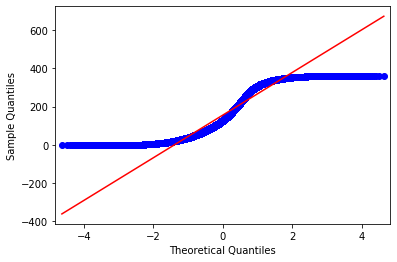

In [0]:
from statsmodels.graphics.gofplots import qqplot
qqplot(df['Aspect'], line='s')
plt.show()

In [0]:
df.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Forest_Cover_Type_designation,Soil_types,Winderness_types
2,2804,139,9,268,65,3180,234,238,135,6121,2,Soil_Type_12,Wilderness_Area_1
3,2785,155,18,242,118,3090,238,238,122,6211,2,Soil_Type_30,Wilderness_Area_1
5,2579,132,6,300,-15,67,230,237,140,6031,2,Soil_Type_29,Wilderness_Area_1
11,2886,151,11,371,26,5253,234,240,136,4051,2,Soil_Type_30,Wilderness_Area_1
12,2742,134,22,150,69,3215,248,224,92,6091,2,Soil_Type_30,Wilderness_Area_1


In [0]:
pt = PowerTransformer()
d = pt.fit_transform(np.array(df['Elevation']).reshape(-1,1))
stats.shapiro(np.log1p(d))

(nan, 1.0)

## IMAGE

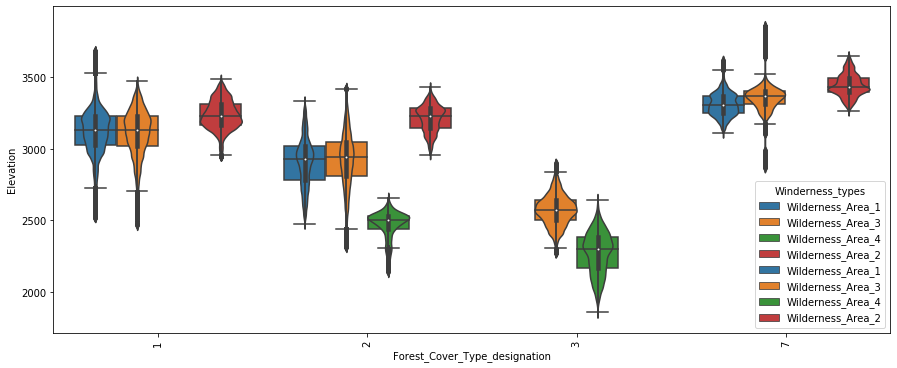

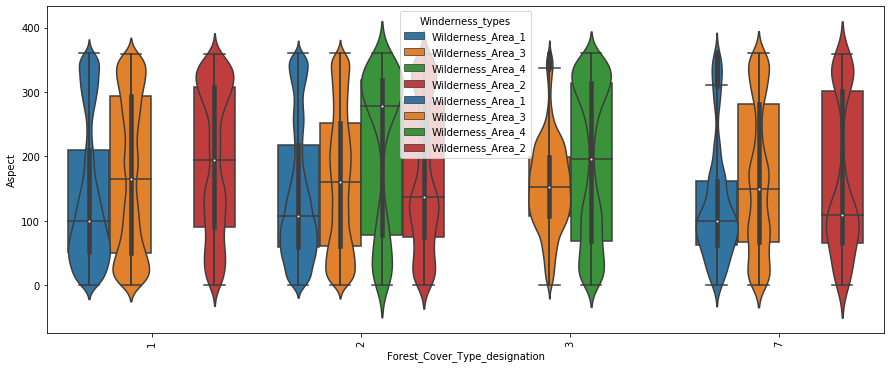

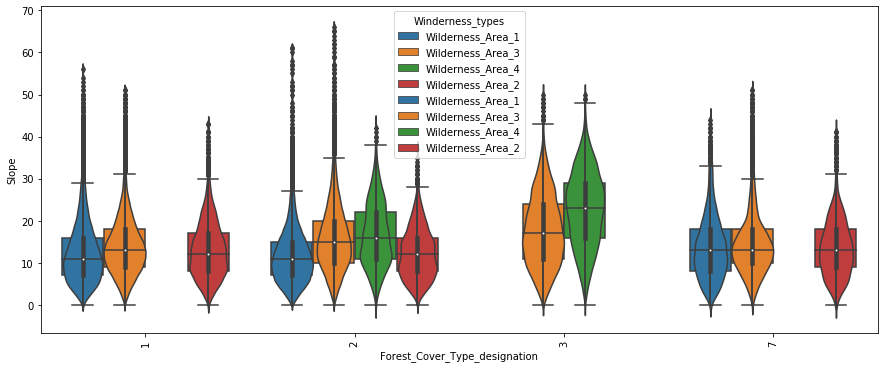

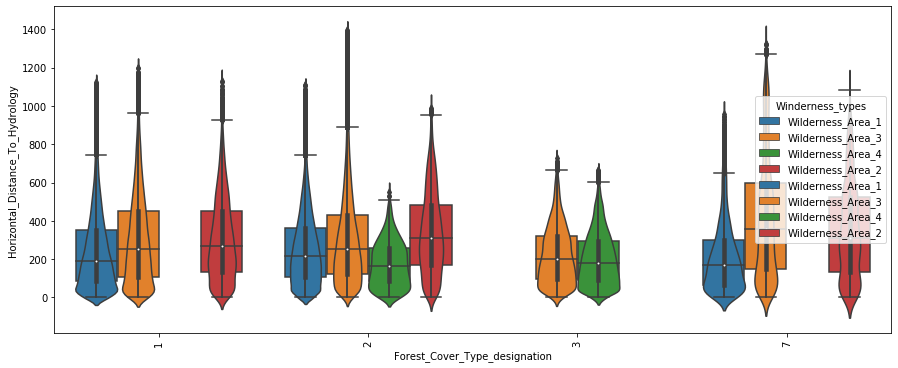

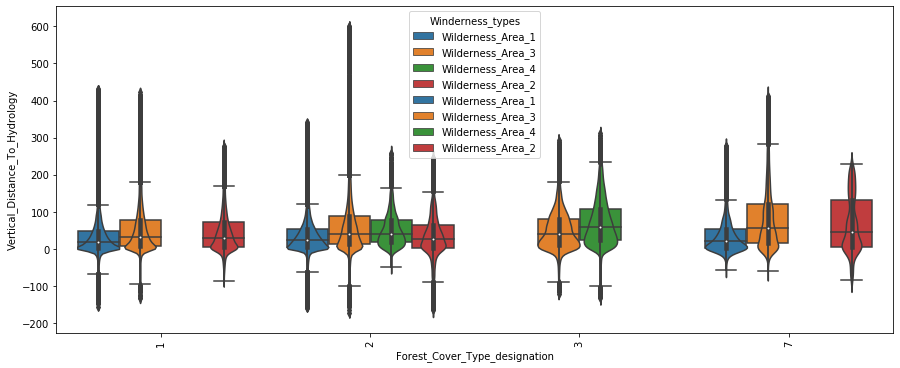

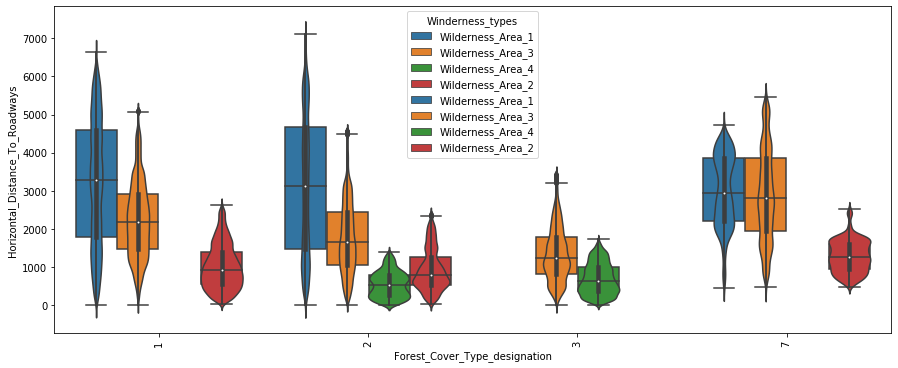

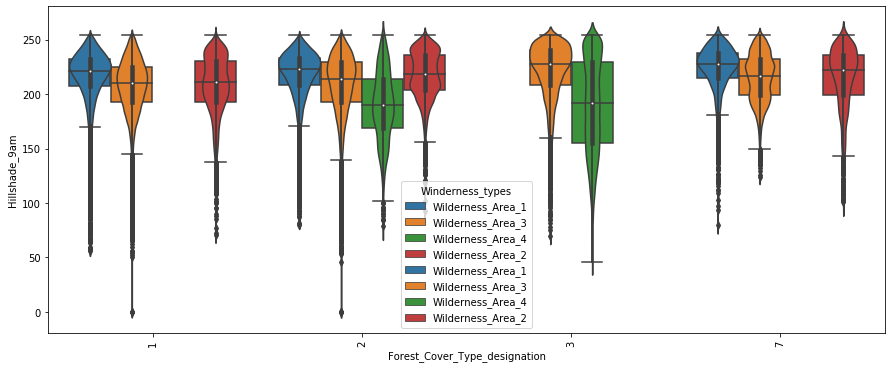

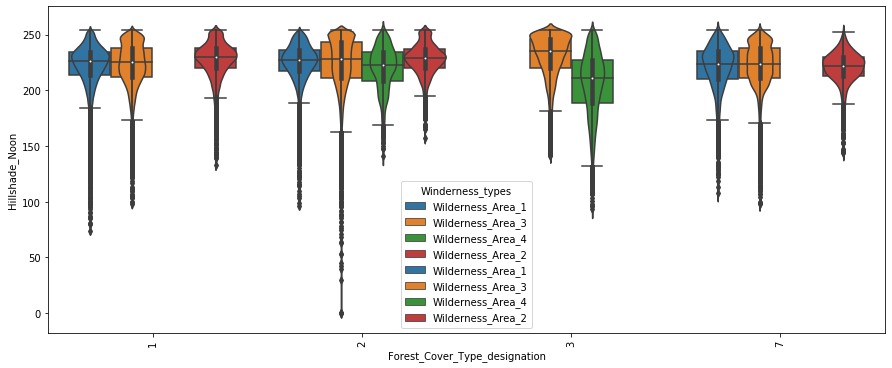

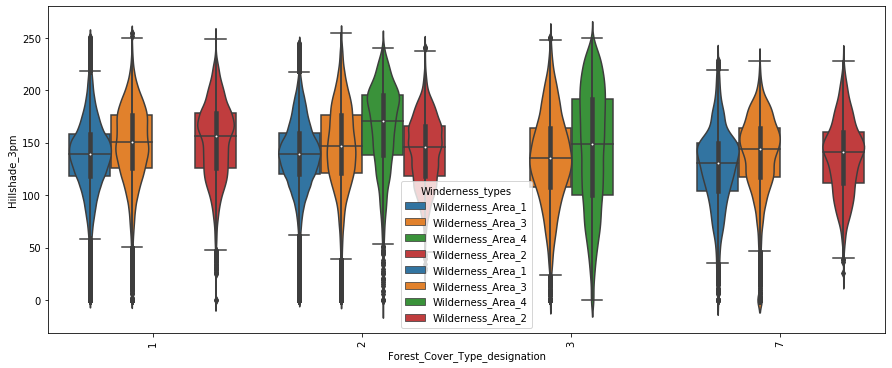

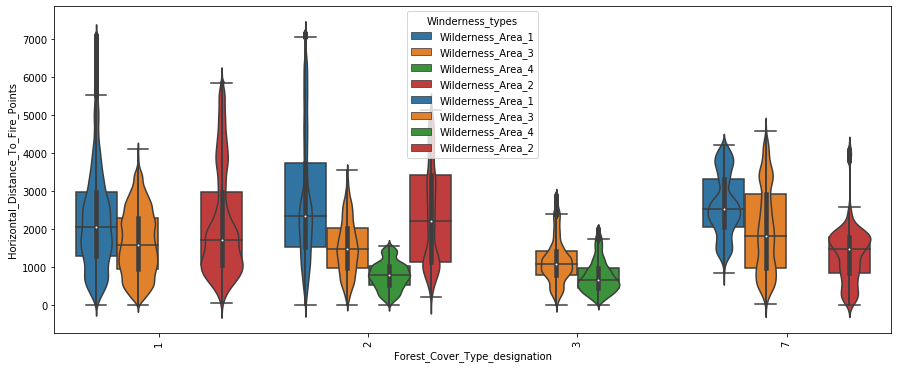

In [0]:
for i in num.columns:
    plt.figure(figsize=(15,6))
    
    sns.violinplot(df['Forest_Cover_Type_designation'], df[i],hue= df['Winderness_types'])
    sns.boxplot(df['Forest_Cover_Type_designation'], df[i],hue= df['Winderness_types'])
    plt.xticks(rotation=90)
    plt.show()

<Figure size 864x432 with 0 Axes>

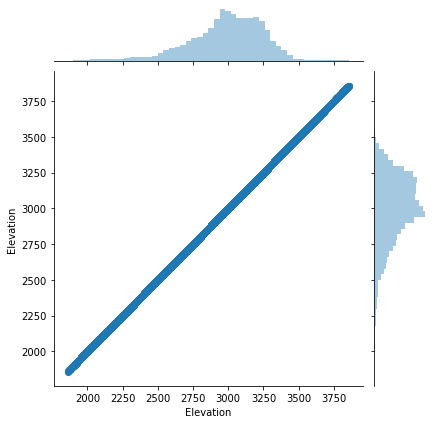

<Figure size 864x432 with 0 Axes>

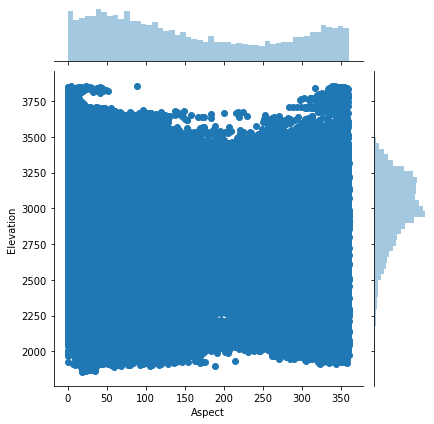

<Figure size 864x432 with 0 Axes>

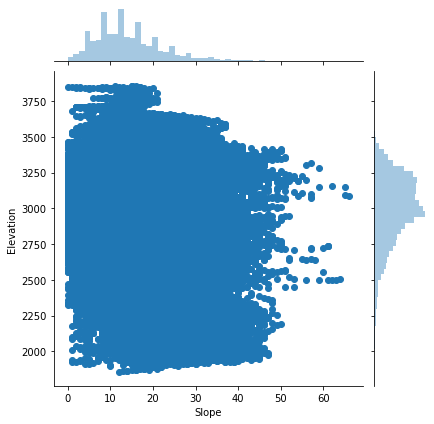

<Figure size 864x432 with 0 Axes>

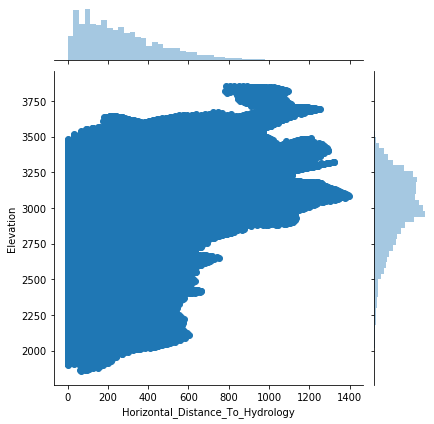

<Figure size 864x432 with 0 Axes>

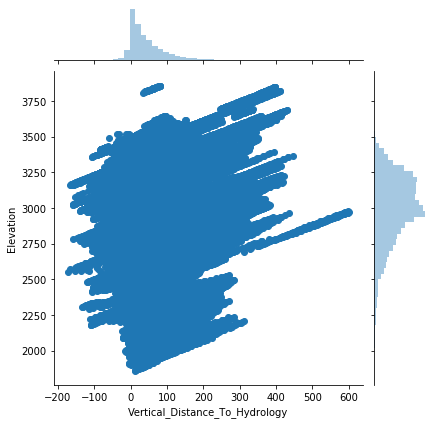

<Figure size 864x432 with 0 Axes>

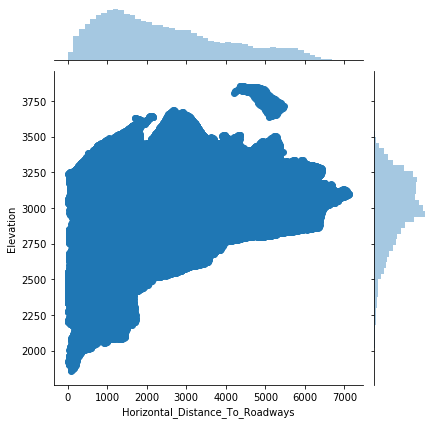

<Figure size 864x432 with 0 Axes>

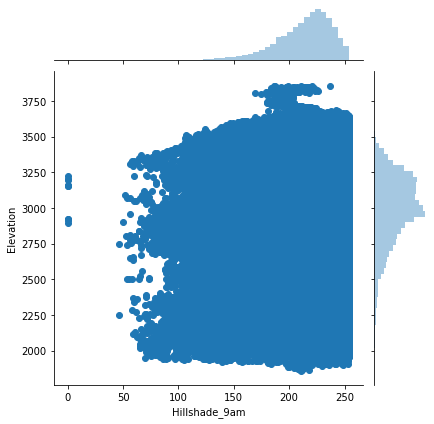

<Figure size 864x432 with 0 Axes>

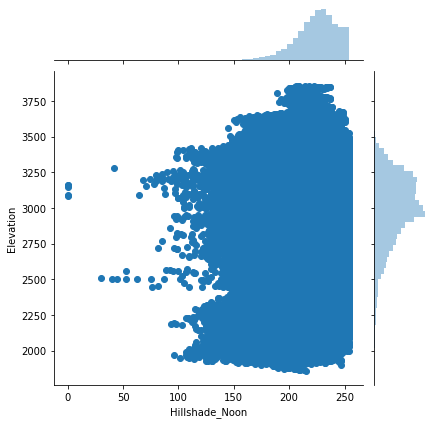

<Figure size 864x432 with 0 Axes>

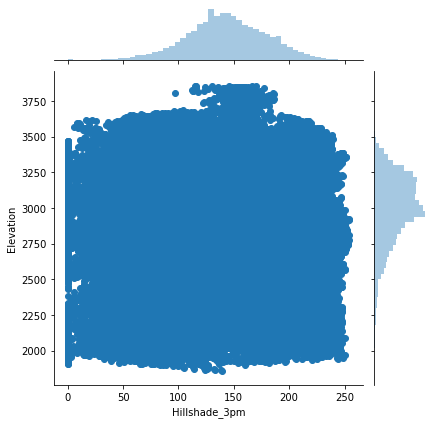

<Figure size 864x432 with 0 Axes>

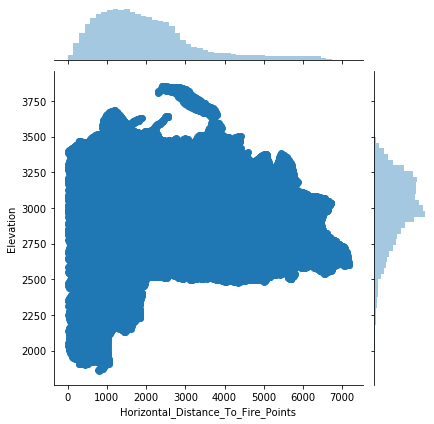

<Figure size 864x432 with 0 Axes>

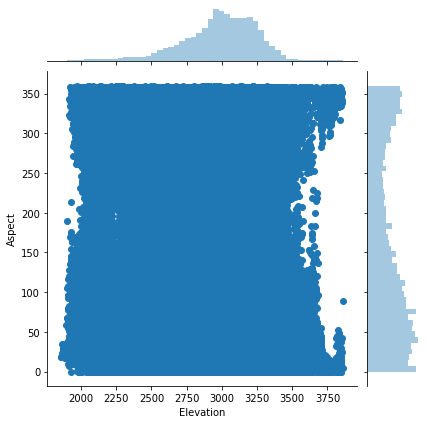

<Figure size 864x432 with 0 Axes>

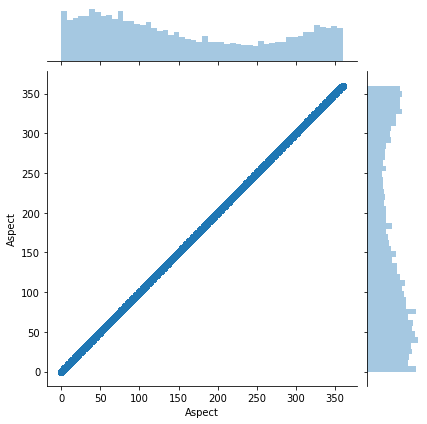

<Figure size 864x432 with 0 Axes>

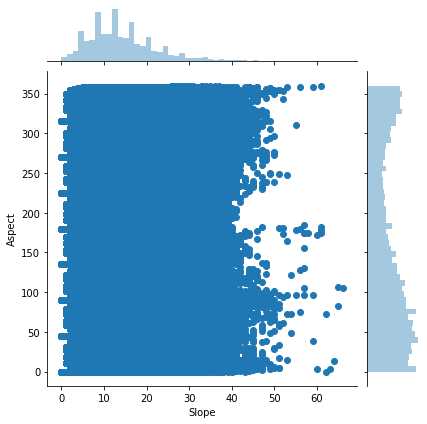

<Figure size 864x432 with 0 Axes>

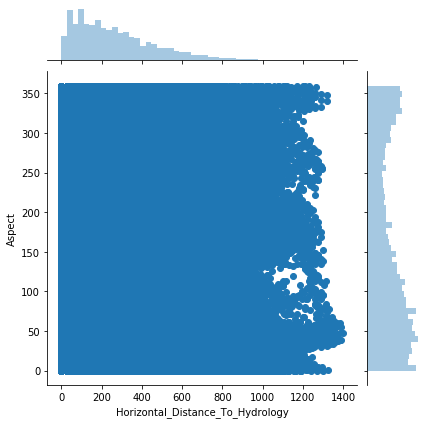

<Figure size 864x432 with 0 Axes>

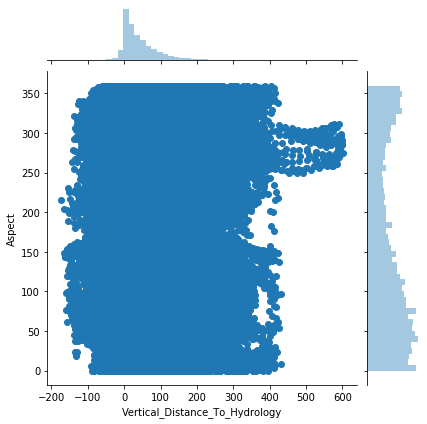

<Figure size 864x432 with 0 Axes>

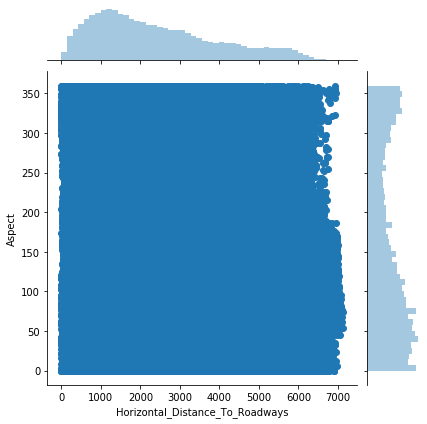

<Figure size 864x432 with 0 Axes>

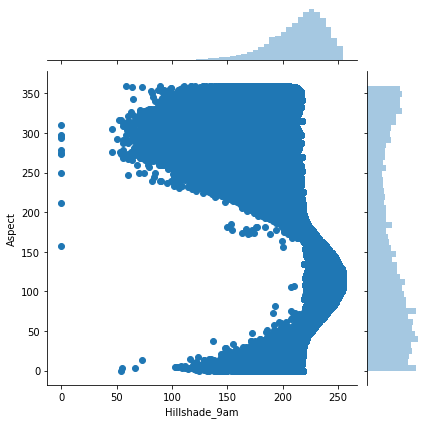

<Figure size 864x432 with 0 Axes>

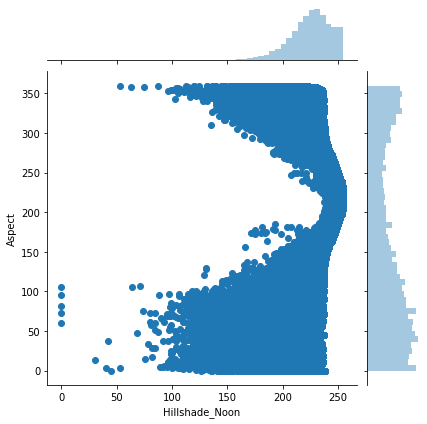

<Figure size 864x432 with 0 Axes>

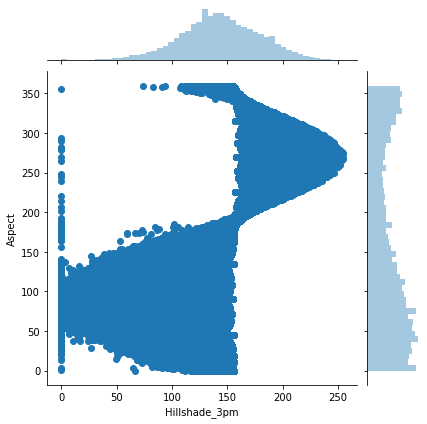

<Figure size 864x432 with 0 Axes>

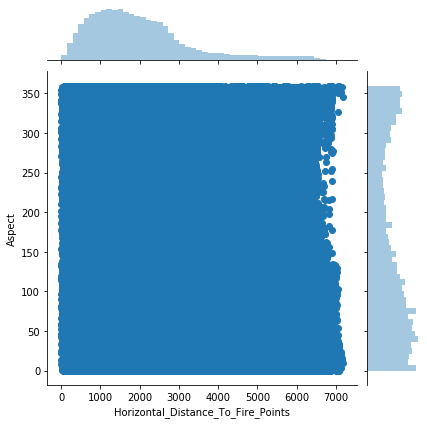

<Figure size 864x432 with 0 Axes>

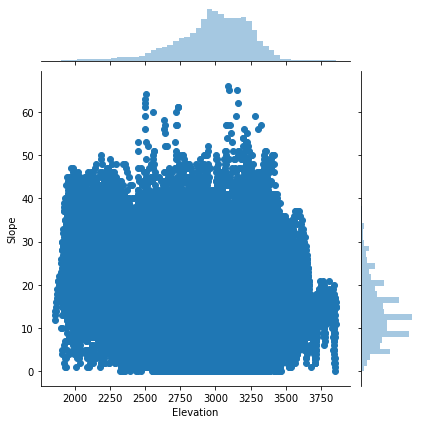

<Figure size 864x432 with 0 Axes>

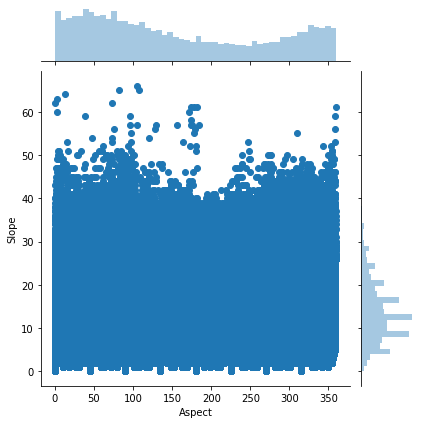

<Figure size 864x432 with 0 Axes>

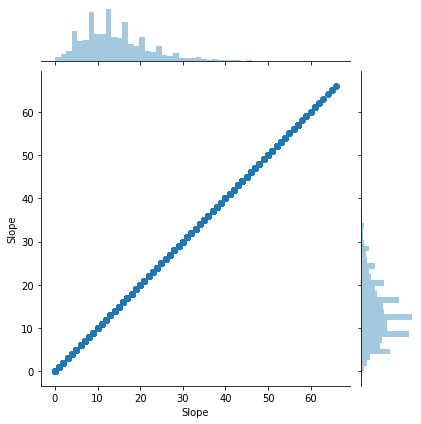

<Figure size 864x432 with 0 Axes>

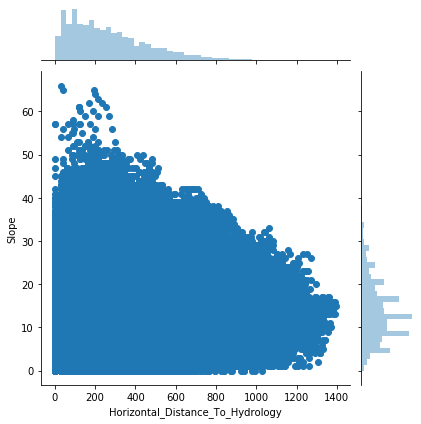

<Figure size 864x432 with 0 Axes>

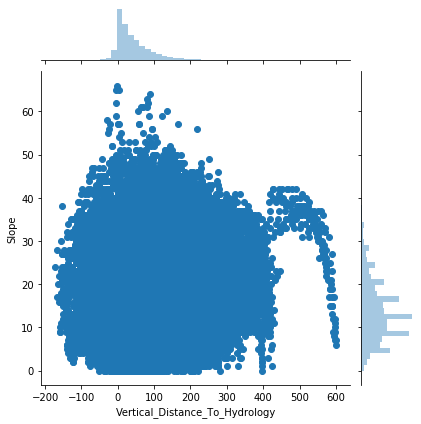

<Figure size 864x432 with 0 Axes>

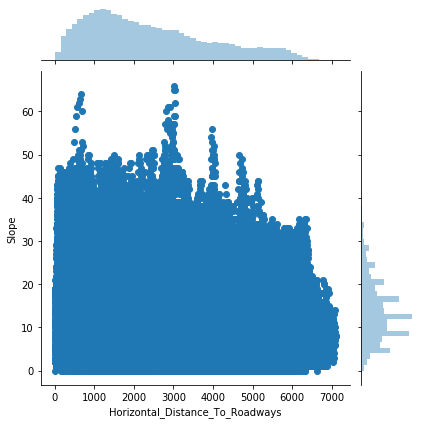

<Figure size 864x432 with 0 Axes>

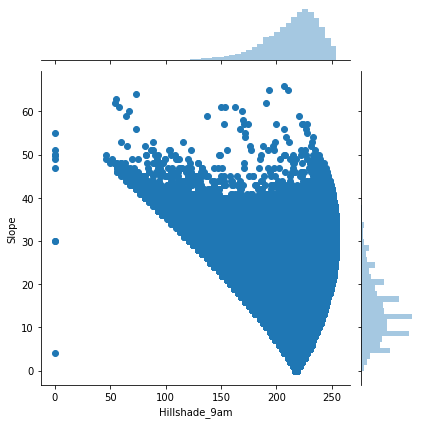

<Figure size 864x432 with 0 Axes>

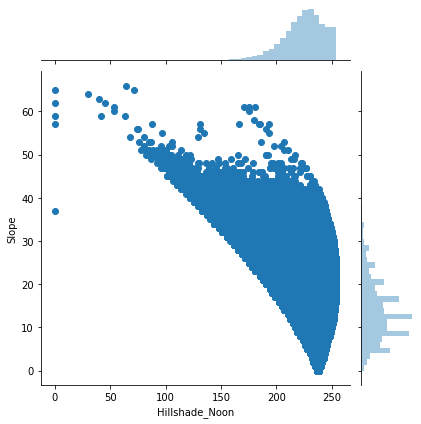

<Figure size 864x432 with 0 Axes>

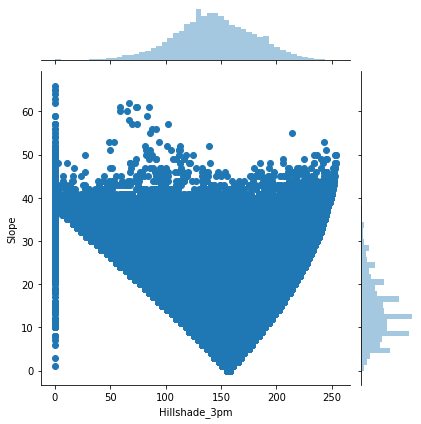

<Figure size 864x432 with 0 Axes>

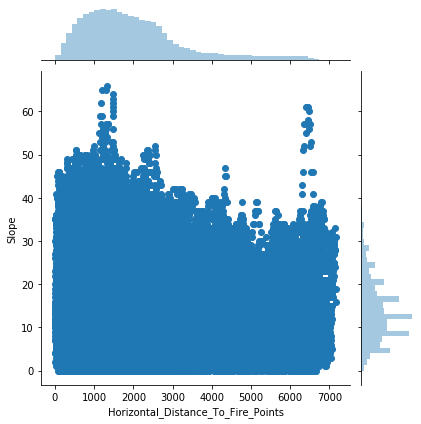

<Figure size 864x432 with 0 Axes>

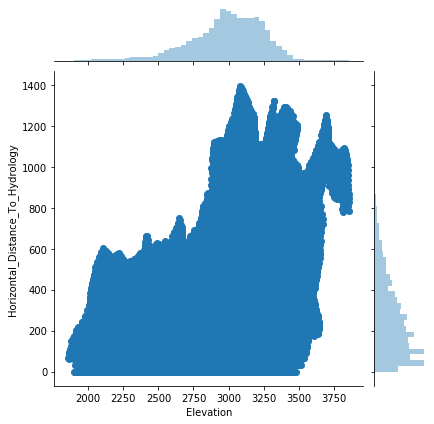

<Figure size 864x432 with 0 Axes>

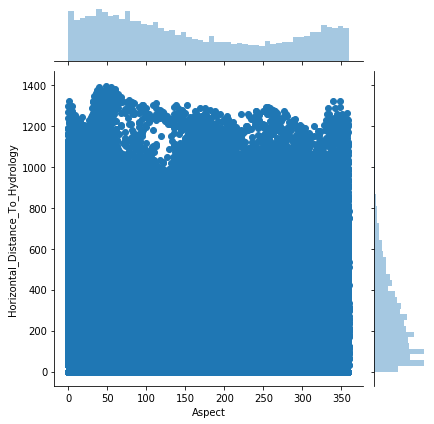

<Figure size 864x432 with 0 Axes>

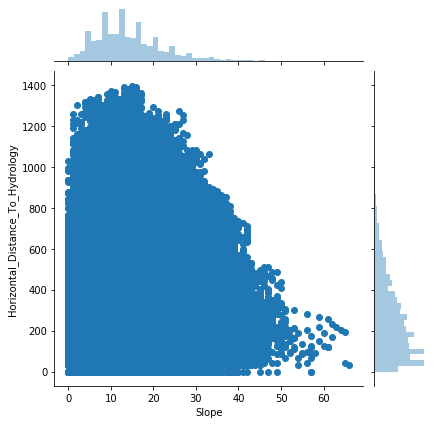

<Figure size 864x432 with 0 Axes>

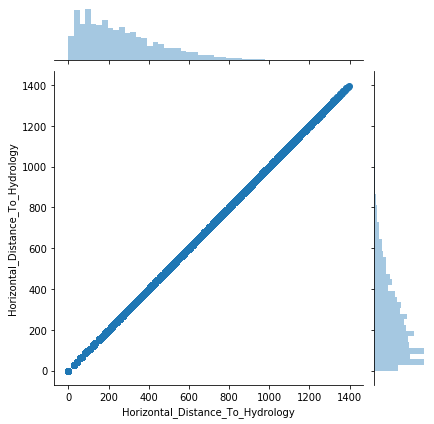

<Figure size 864x432 with 0 Axes>

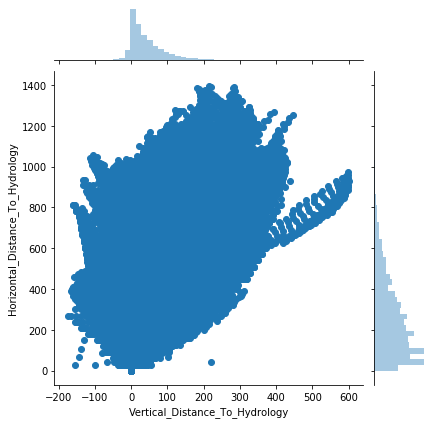

<Figure size 864x432 with 0 Axes>

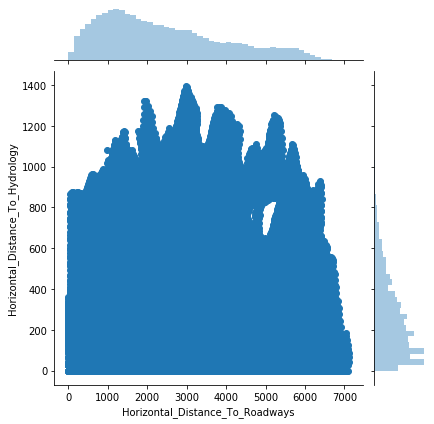

<Figure size 864x432 with 0 Axes>

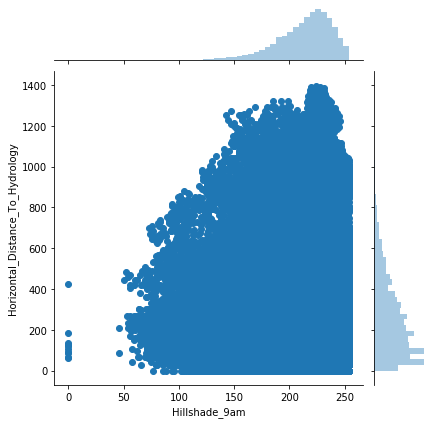

<Figure size 864x432 with 0 Axes>

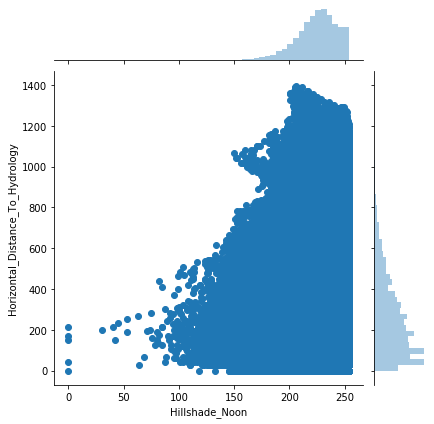

<Figure size 864x432 with 0 Axes>

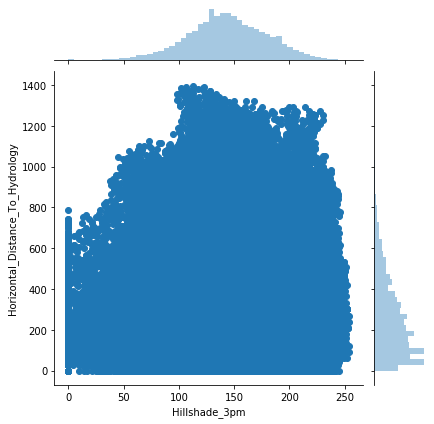

<Figure size 864x432 with 0 Axes>

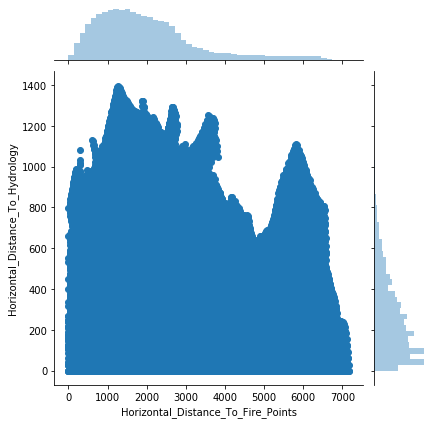

<Figure size 864x432 with 0 Axes>

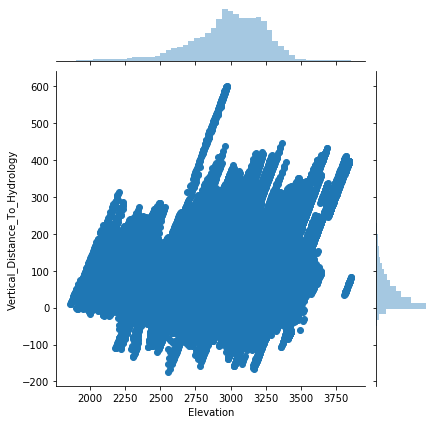

<Figure size 864x432 with 0 Axes>

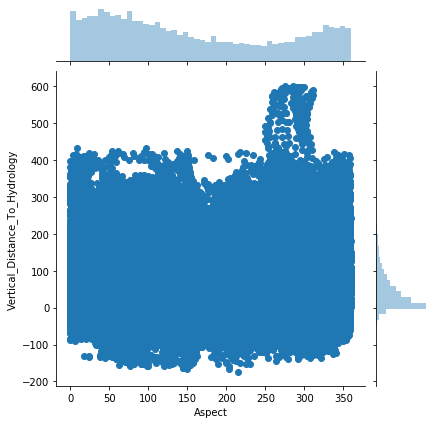

<Figure size 864x432 with 0 Axes>

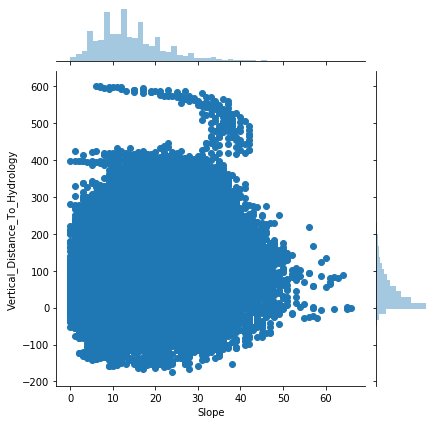

<Figure size 864x432 with 0 Axes>

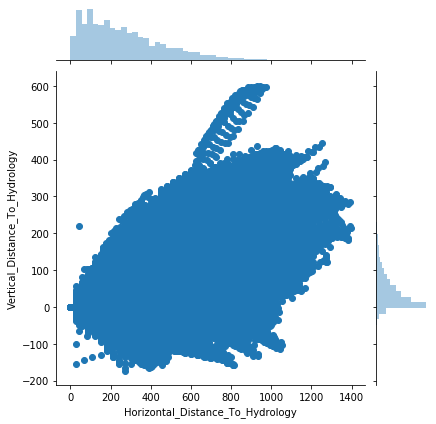

<Figure size 864x432 with 0 Axes>

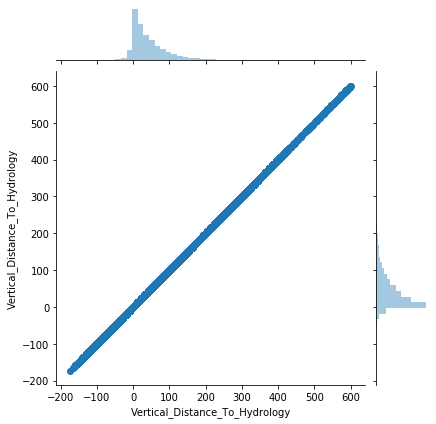

<Figure size 864x432 with 0 Axes>

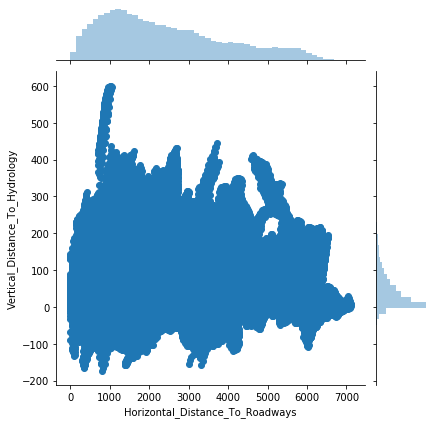

<Figure size 864x432 with 0 Axes>

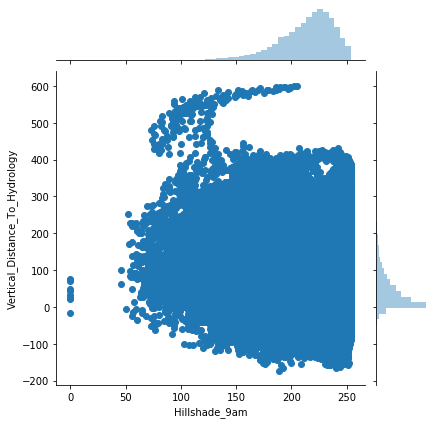

<Figure size 864x432 with 0 Axes>

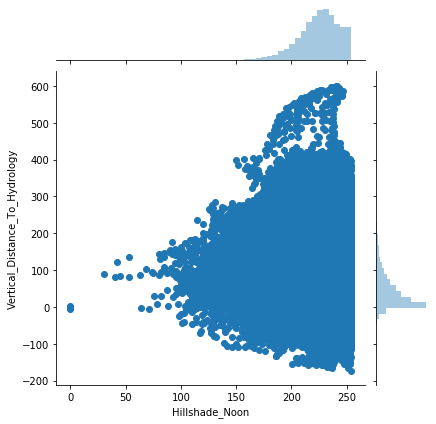

<Figure size 864x432 with 0 Axes>

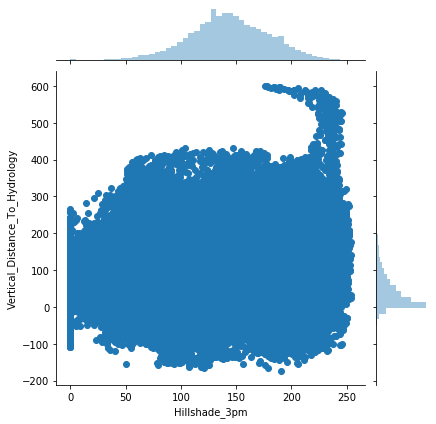

<Figure size 864x432 with 0 Axes>

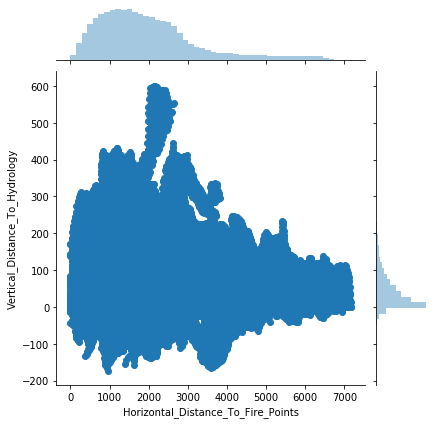

<Figure size 864x432 with 0 Axes>

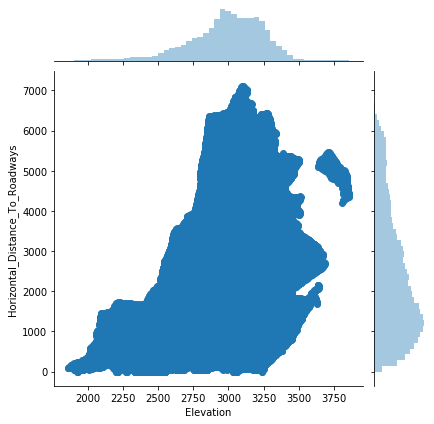

<Figure size 864x432 with 0 Axes>

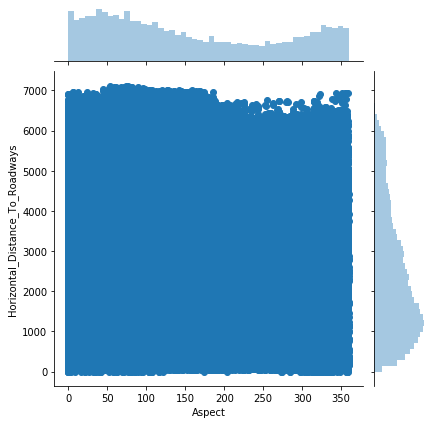

<Figure size 864x432 with 0 Axes>

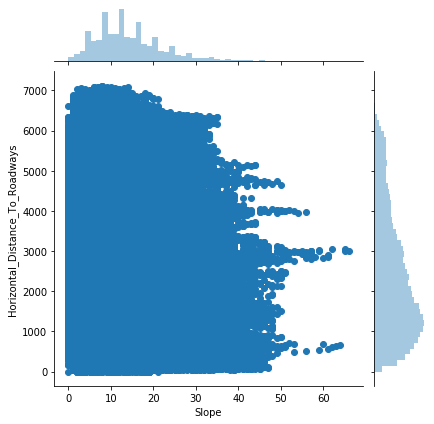

<Figure size 864x432 with 0 Axes>

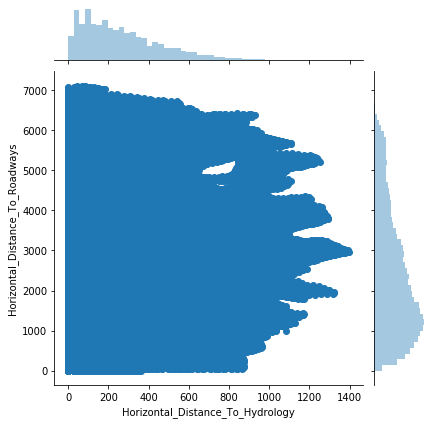

<Figure size 864x432 with 0 Axes>

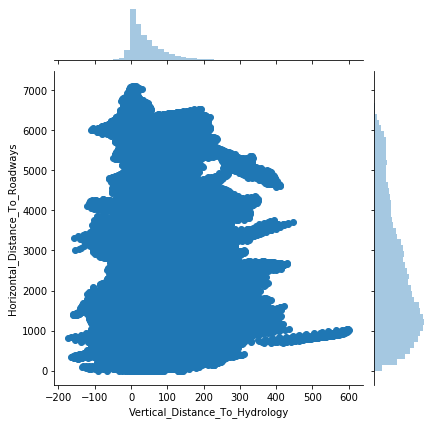

<Figure size 864x432 with 0 Axes>

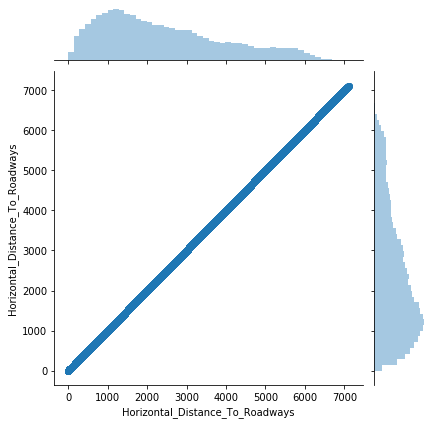

<Figure size 864x432 with 0 Axes>

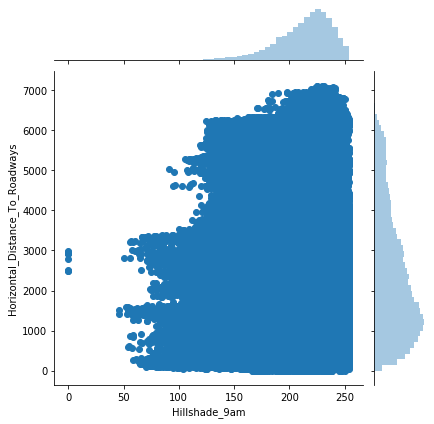

<Figure size 864x432 with 0 Axes>

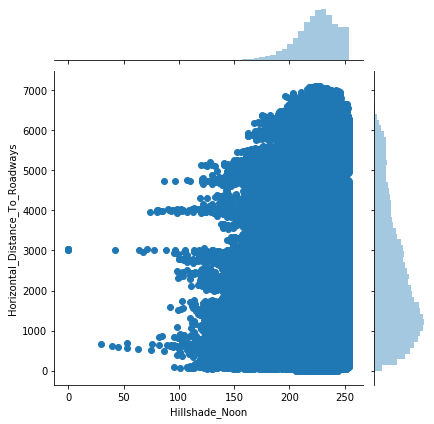

<Figure size 864x432 with 0 Axes>

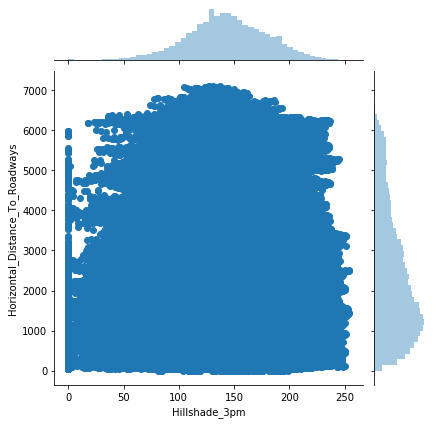

<Figure size 864x432 with 0 Axes>

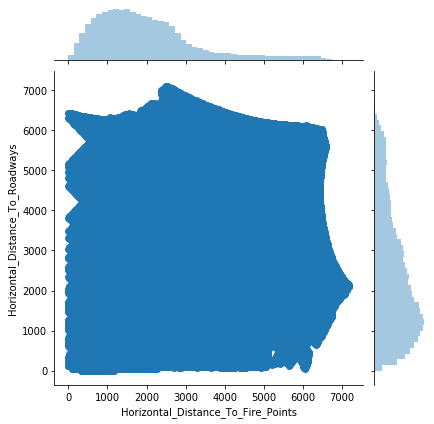

<Figure size 864x432 with 0 Axes>

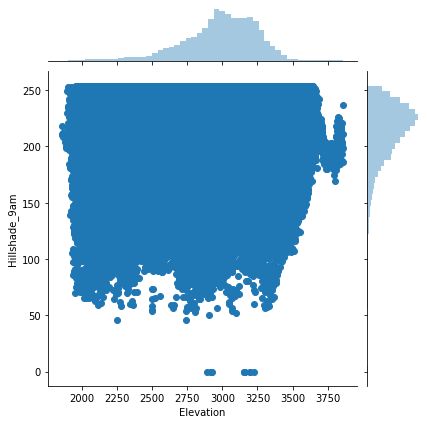

<Figure size 864x432 with 0 Axes>

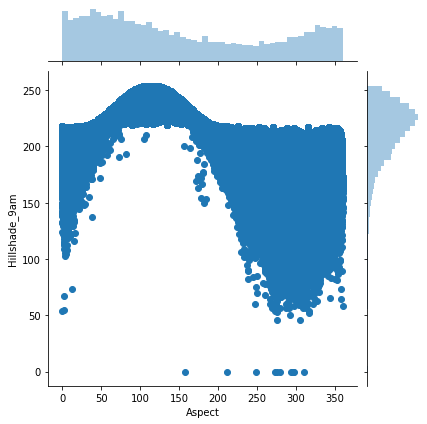

<Figure size 864x432 with 0 Axes>

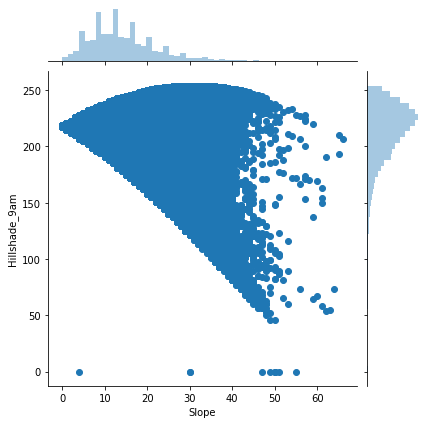

<Figure size 864x432 with 0 Axes>

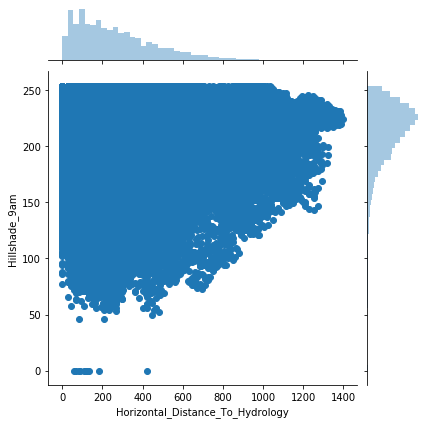

<Figure size 864x432 with 0 Axes>

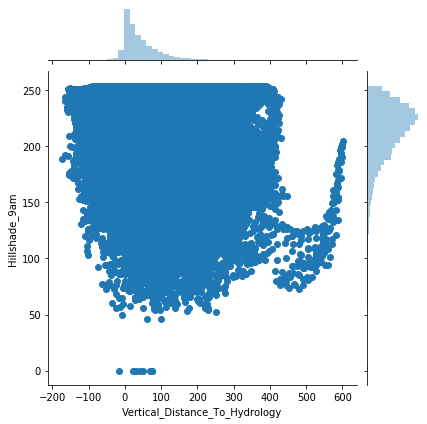

<Figure size 864x432 with 0 Axes>

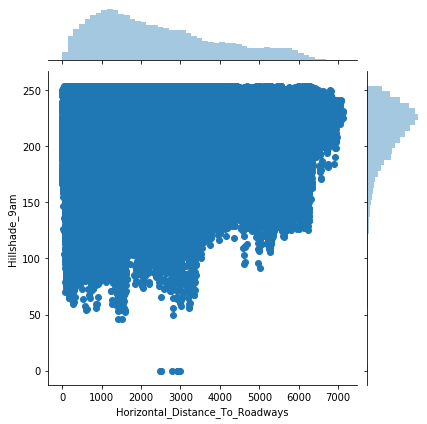

<Figure size 864x432 with 0 Axes>

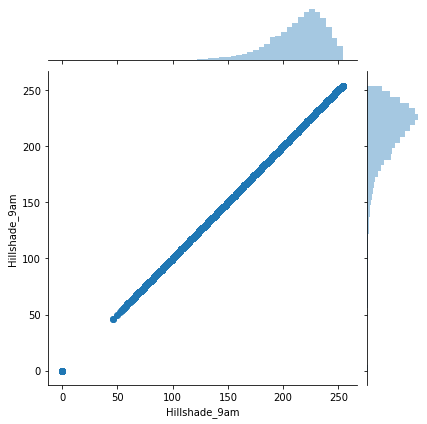

<Figure size 864x432 with 0 Axes>

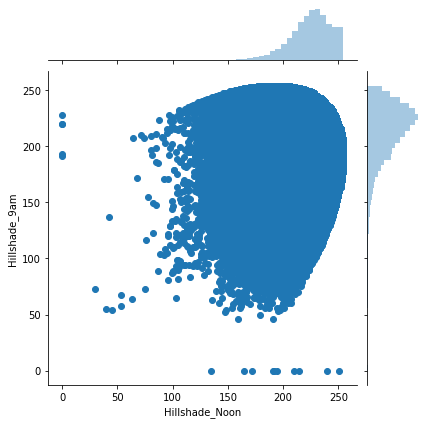

<Figure size 864x432 with 0 Axes>

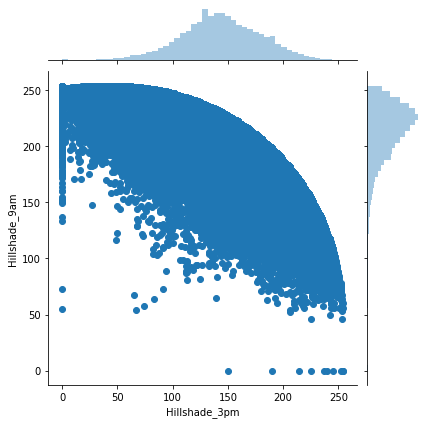

<Figure size 864x432 with 0 Axes>

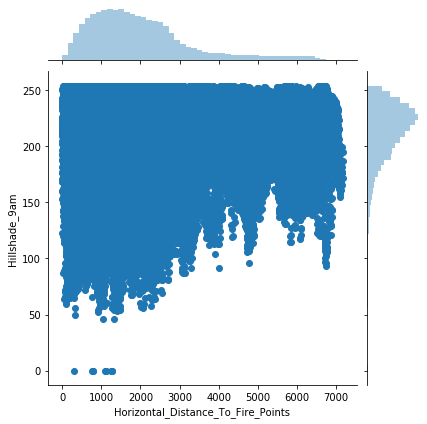

<Figure size 864x432 with 0 Axes>

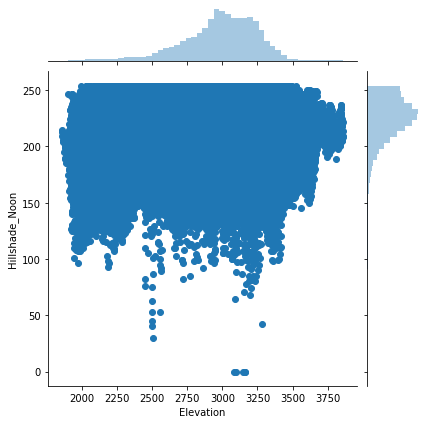

<Figure size 864x432 with 0 Axes>

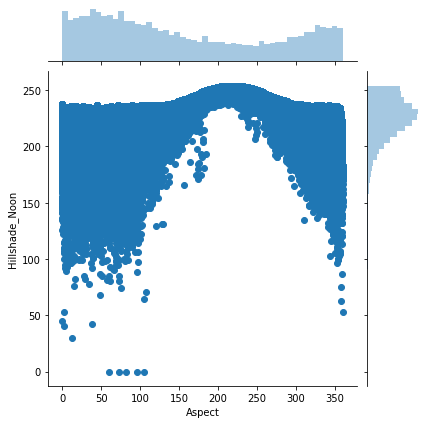

<Figure size 864x432 with 0 Axes>

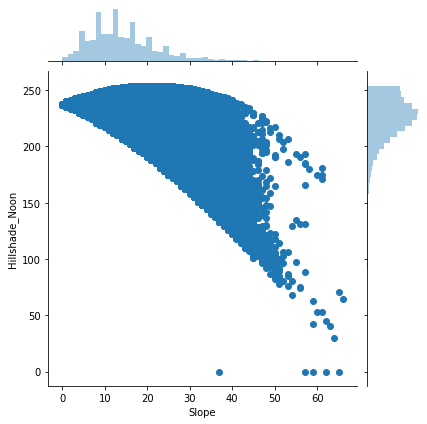

<Figure size 864x432 with 0 Axes>

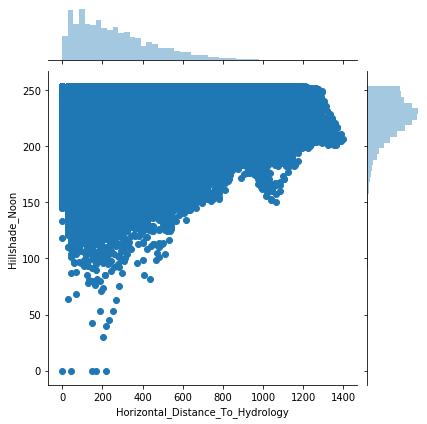

<Figure size 864x432 with 0 Axes>

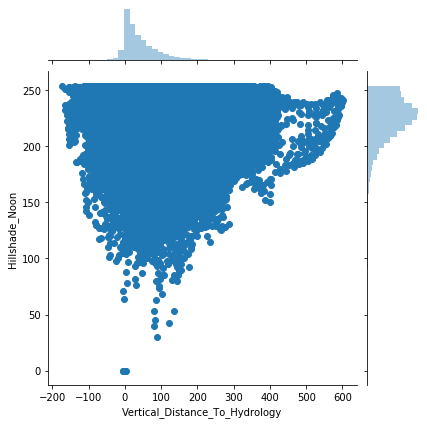

<Figure size 864x432 with 0 Axes>

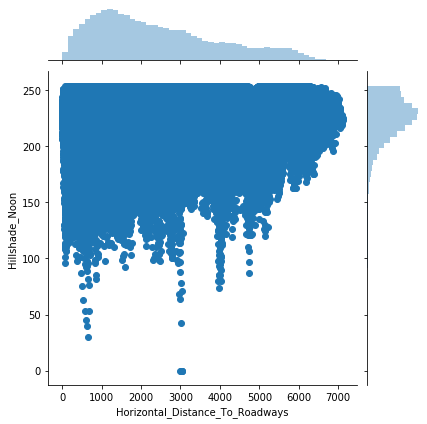

<Figure size 864x432 with 0 Axes>

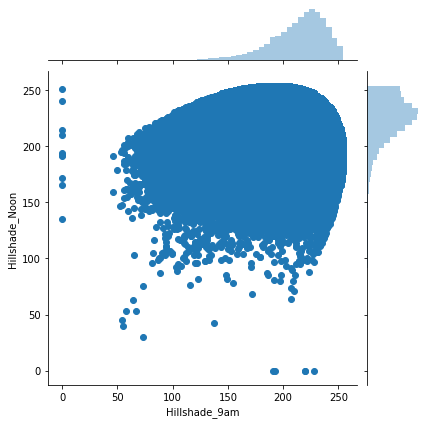

<Figure size 864x432 with 0 Axes>

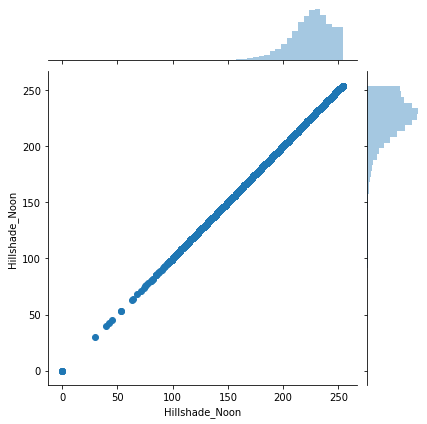

<Figure size 864x432 with 0 Axes>

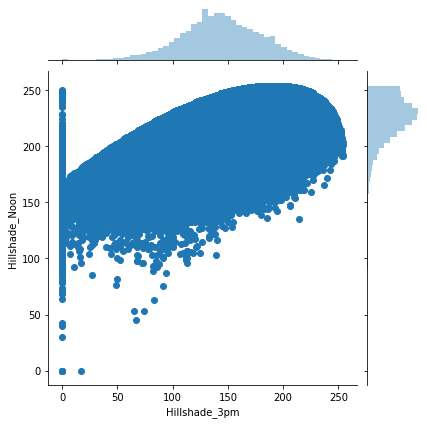

<Figure size 864x432 with 0 Axes>

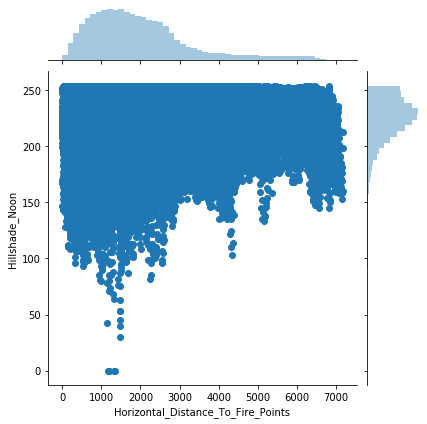

<Figure size 864x432 with 0 Axes>

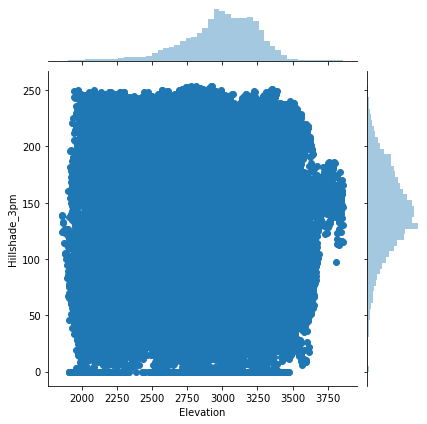

<Figure size 864x432 with 0 Axes>

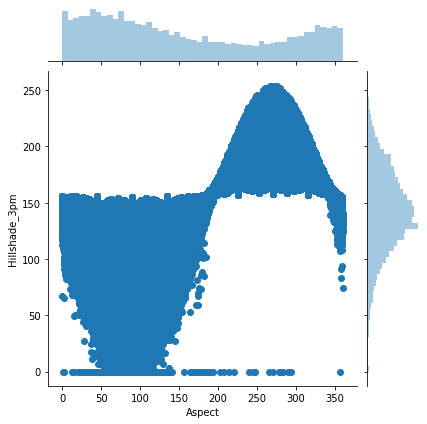

<Figure size 864x432 with 0 Axes>

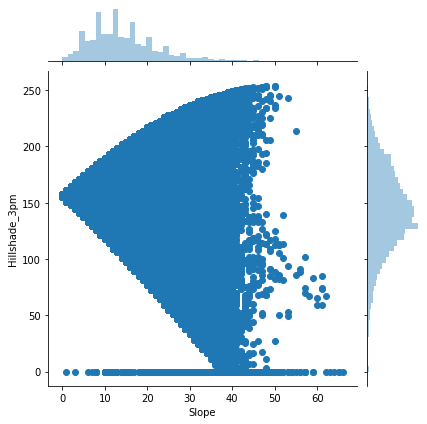

<Figure size 864x432 with 0 Axes>

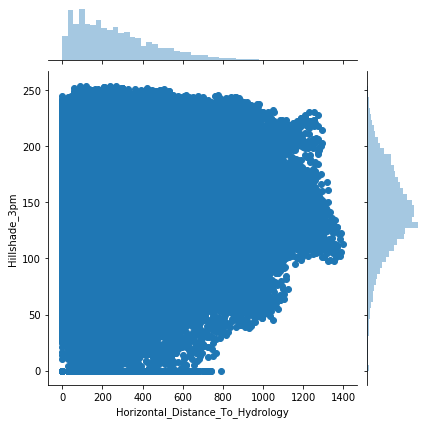

<Figure size 864x432 with 0 Axes>

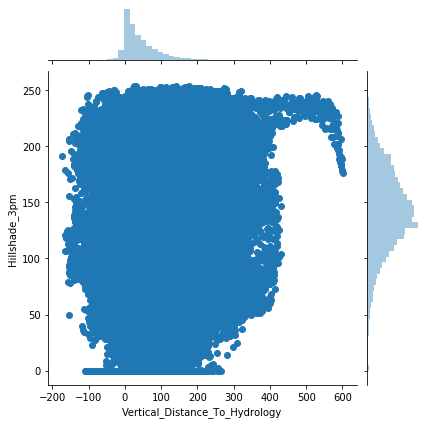

<Figure size 864x432 with 0 Axes>

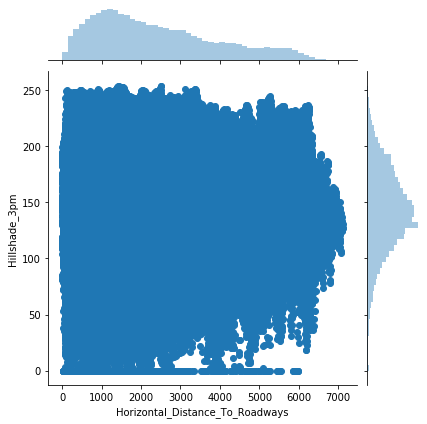

<Figure size 864x432 with 0 Axes>

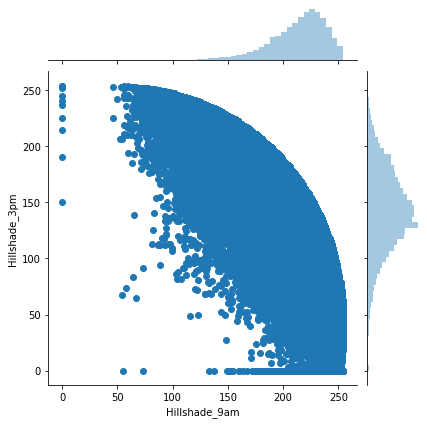

<Figure size 864x432 with 0 Axes>

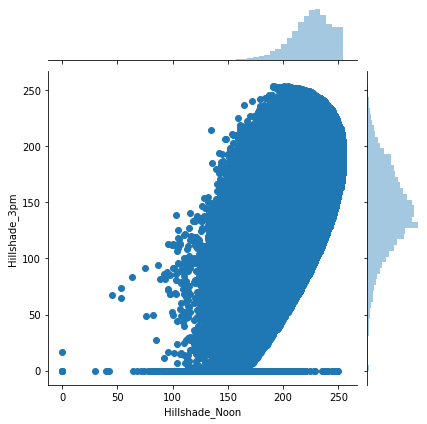

<Figure size 864x432 with 0 Axes>

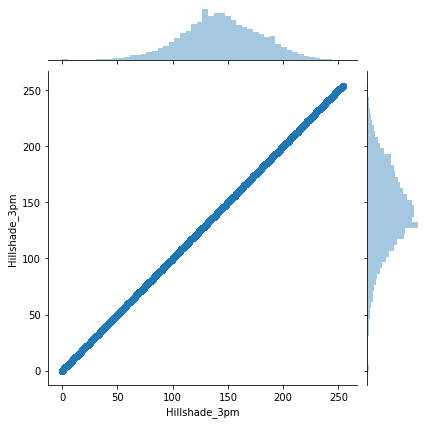

<Figure size 864x432 with 0 Axes>

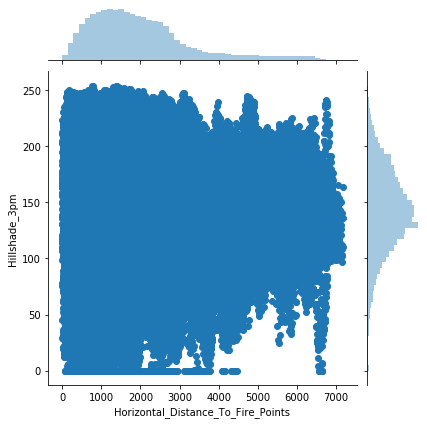

<Figure size 864x432 with 0 Axes>

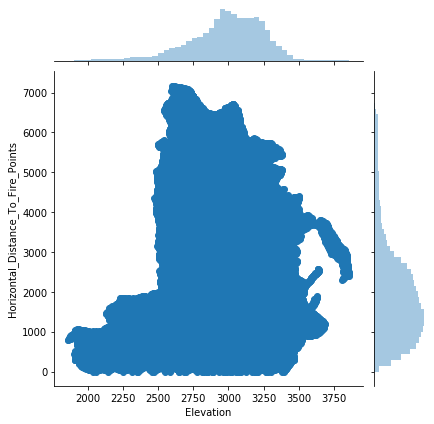

<Figure size 864x432 with 0 Axes>

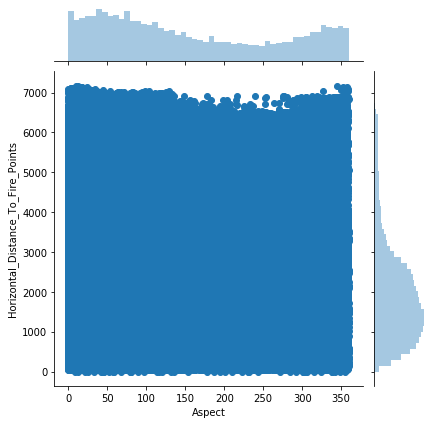

<Figure size 864x432 with 0 Axes>

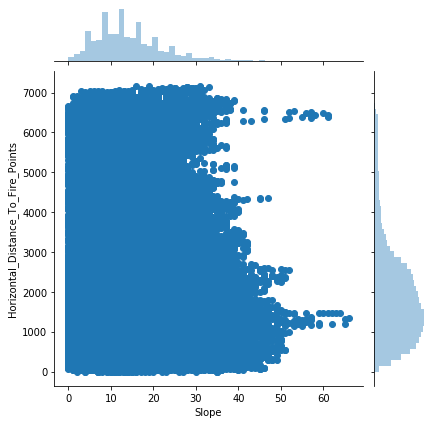

<Figure size 864x432 with 0 Axes>

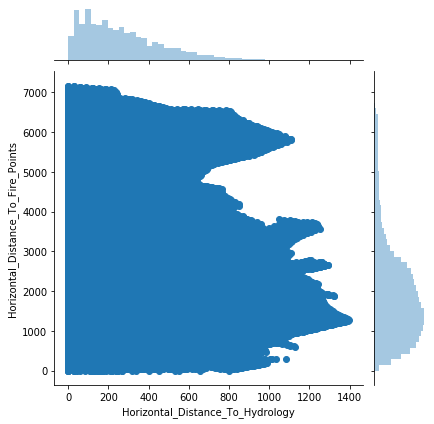

<Figure size 864x432 with 0 Axes>

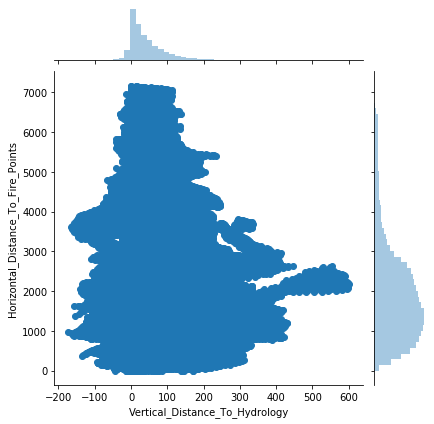

<Figure size 864x432 with 0 Axes>

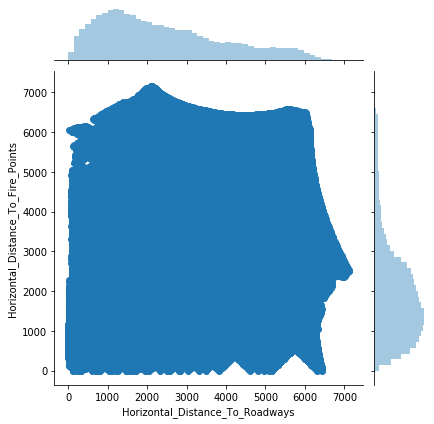

<Figure size 864x432 with 0 Axes>

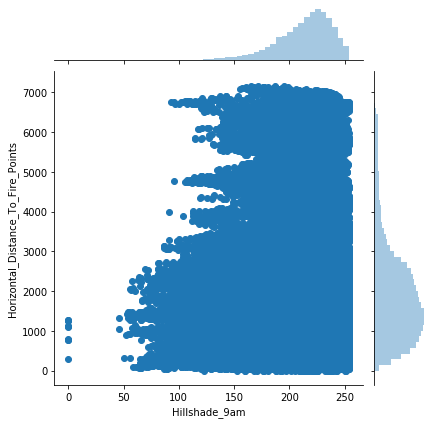

<Figure size 864x432 with 0 Axes>

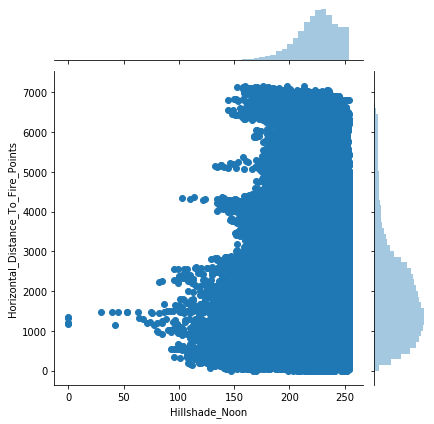

<Figure size 864x432 with 0 Axes>

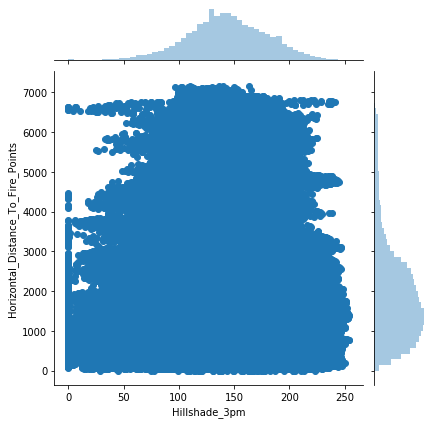

<Figure size 864x432 with 0 Axes>

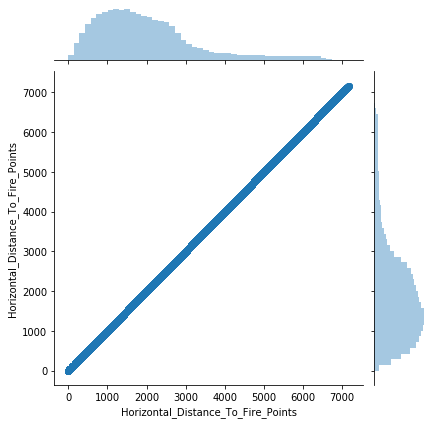

In [0]:
for j in num.columns:
    for i in num.columns:
        plt.figure(figsize=(12,6))
        sns.jointplot(df[i], df[j])
        plt.xticks(rotation=90)
        plt.show()

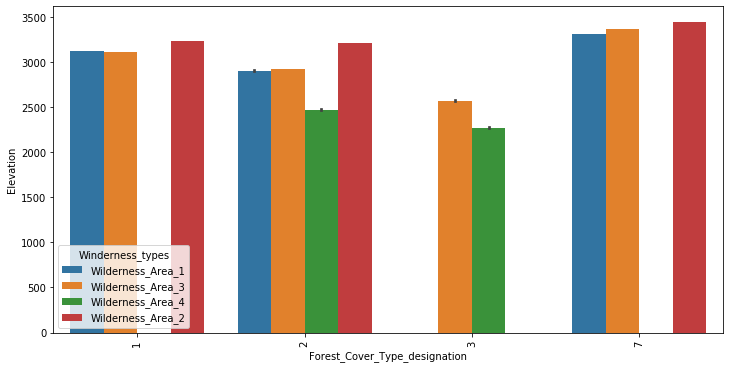

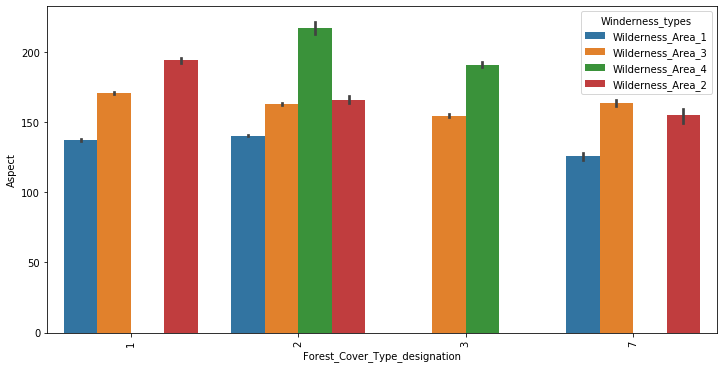

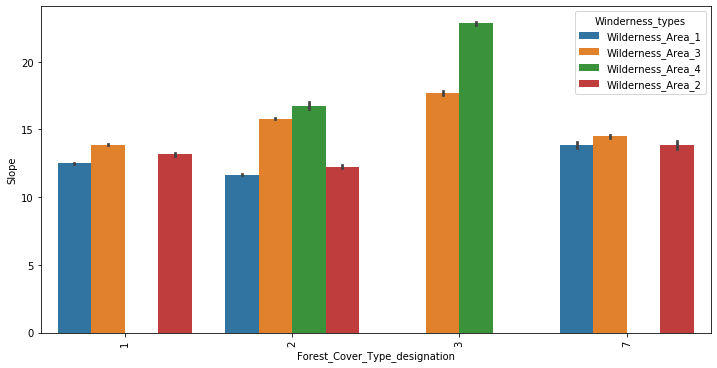

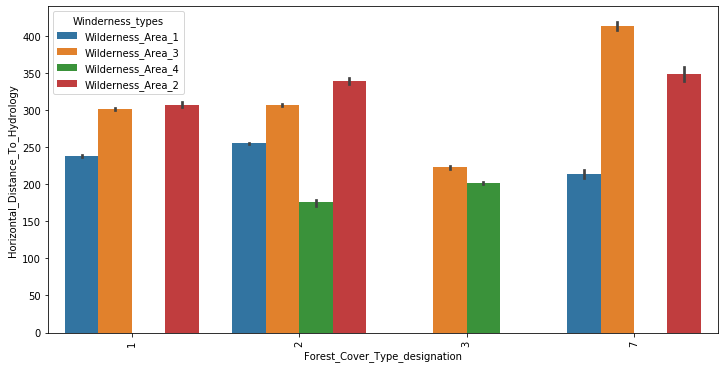

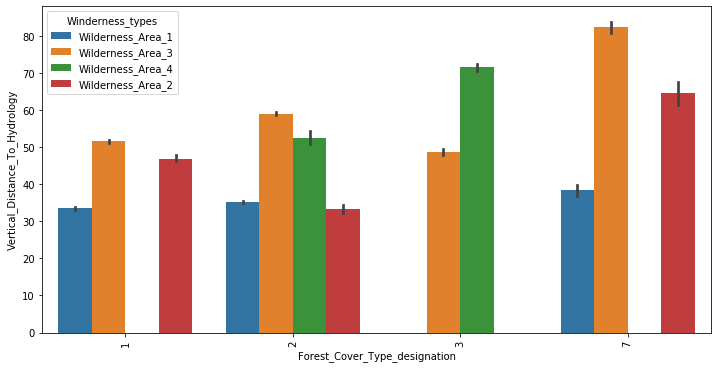

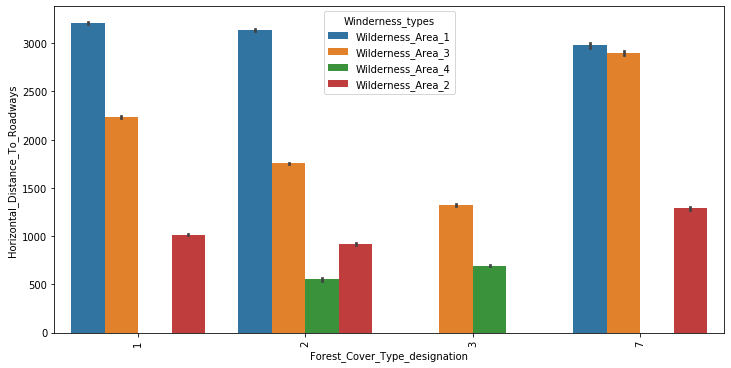

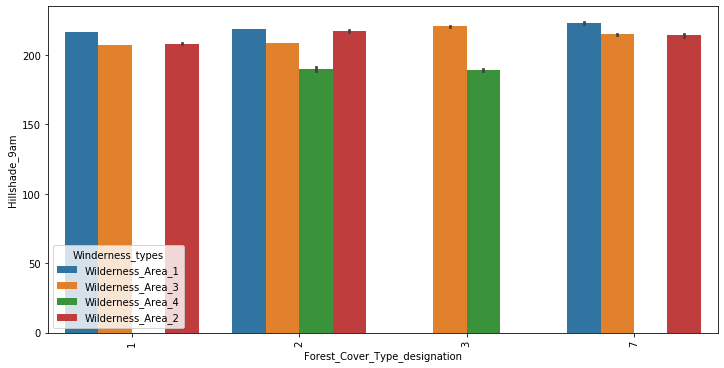

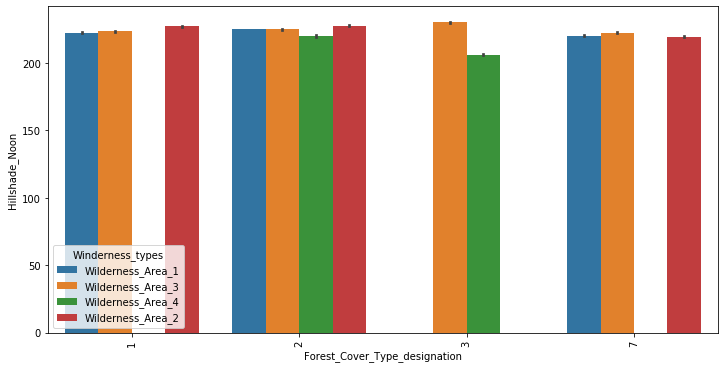

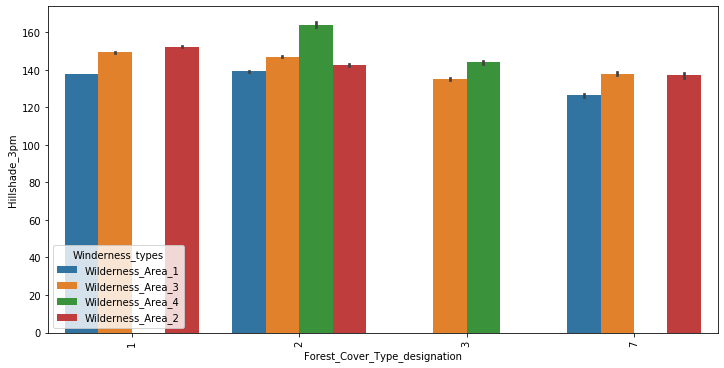

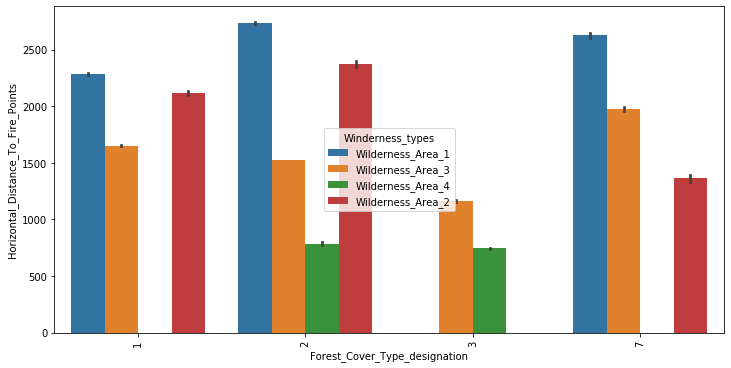

In [0]:
for i in num.columns:
    plt.figure(figsize=(12,6))
    #sns.swarmplot(df[i], df['Forest_Cover_Type_designation'])
    sns.barplot(x = 'Forest_Cover_Type_designation', y = i, hue= 'Winderness_types', data = df)
    plt.xticks(rotation=90)
    plt.show()

## IMAGE

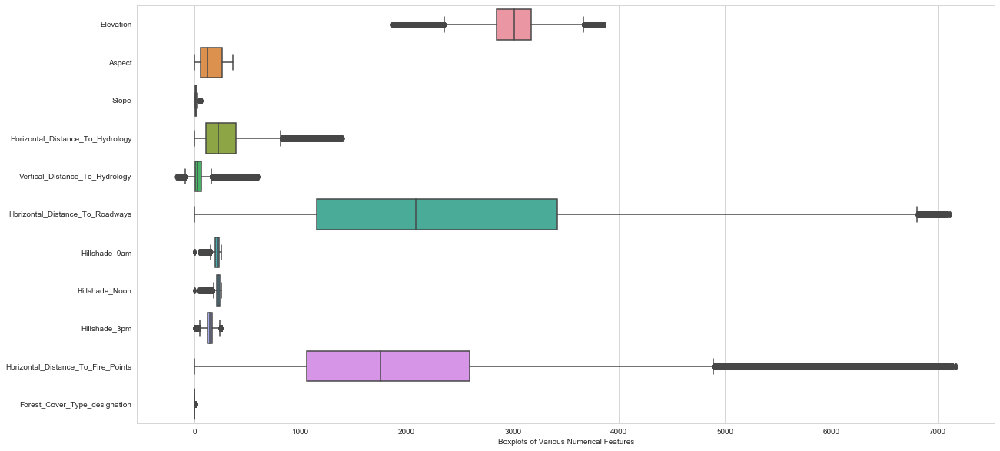

In [0]:
sns.set_style("whitegrid")
plt.figure(figsize=(20, 10))
sns.boxplot(data=df,orient="h")
plt.xlabel('Boxplots of Various Numerical Features')
plt.savefig('All_Boxplots.png', dpi=300)
plt.show()

<Figure size 1080x432 with 0 Axes>

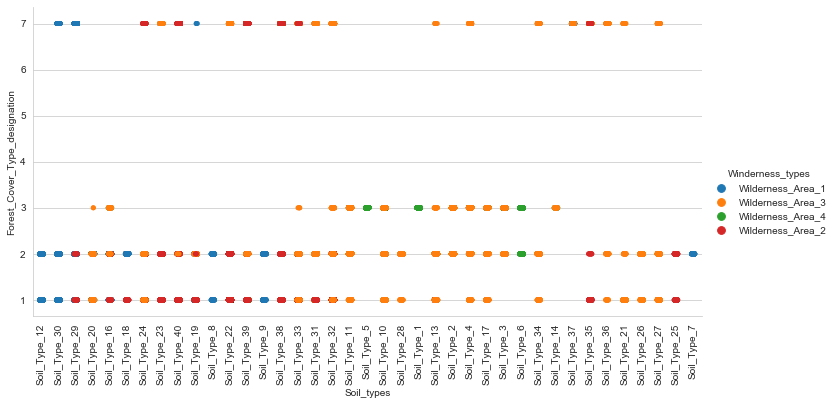

In [0]:
plt.figure(figsize=(15,6))
sns.catplot(x = "Soil_types", y = "Forest_Cover_Type_designation", hue='Winderness_types', data = df, aspect=2)
plt.xticks(rotation=90)
plt.show()

<Figure size 720x720 with 0 Axes>

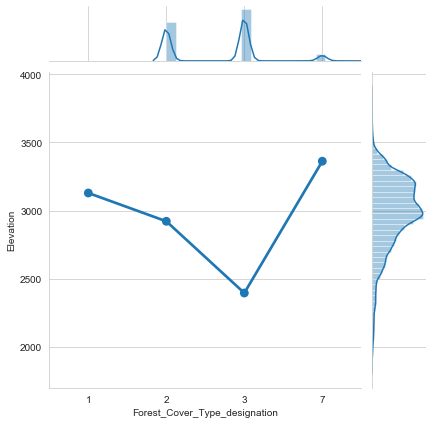

<Figure size 720x720 with 0 Axes>

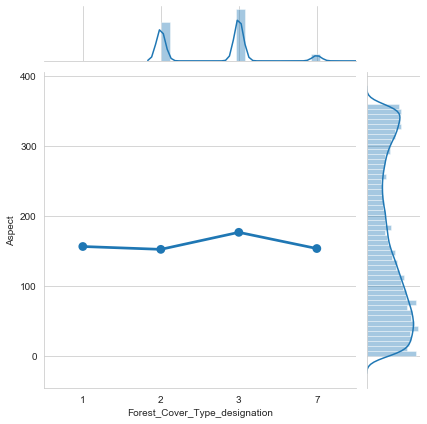

<Figure size 720x720 with 0 Axes>

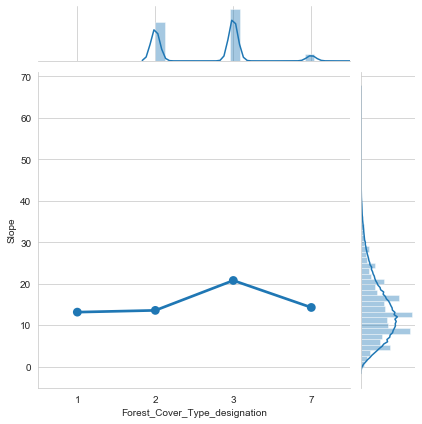

<Figure size 720x720 with 0 Axes>

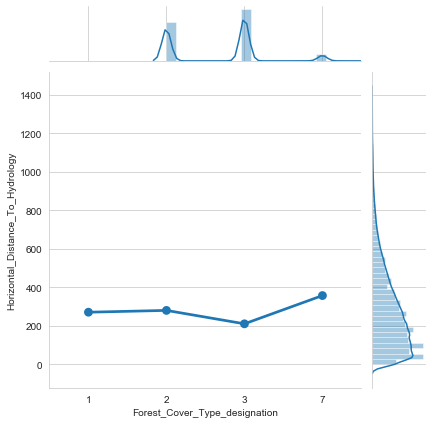

<Figure size 720x720 with 0 Axes>

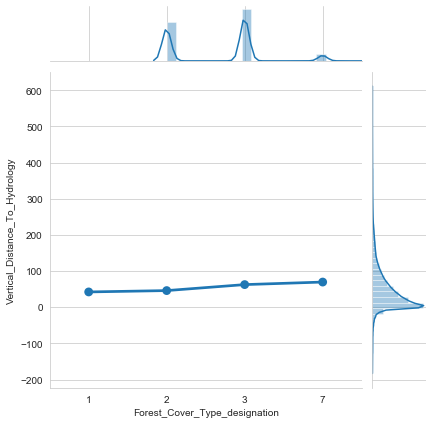

<Figure size 720x720 with 0 Axes>

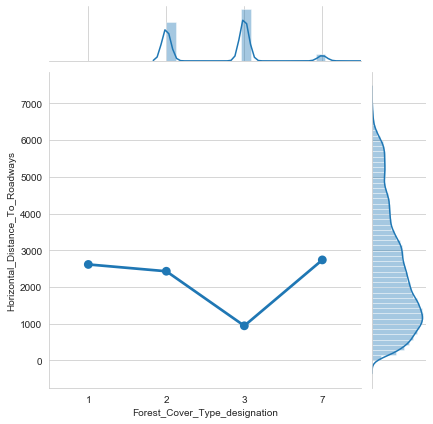

<Figure size 720x720 with 0 Axes>

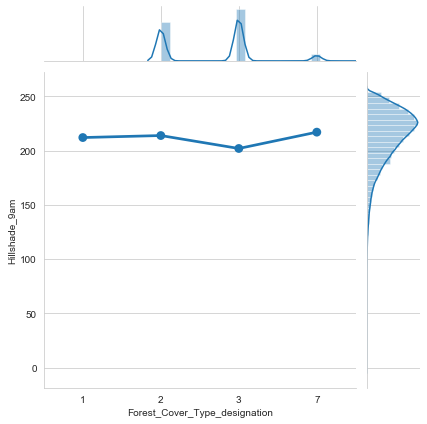

<Figure size 720x720 with 0 Axes>

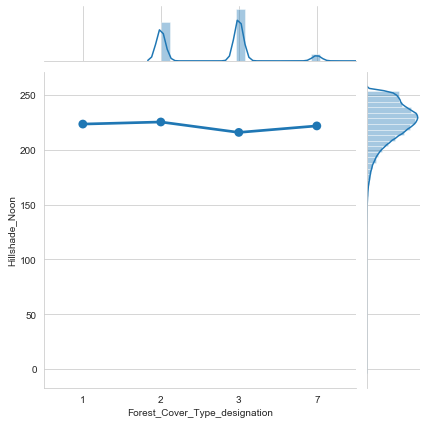

<Figure size 720x720 with 0 Axes>

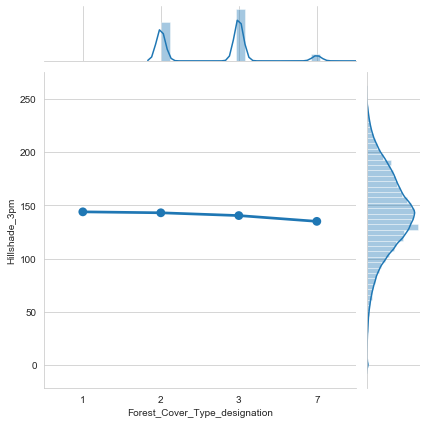

<Figure size 720x720 with 0 Axes>

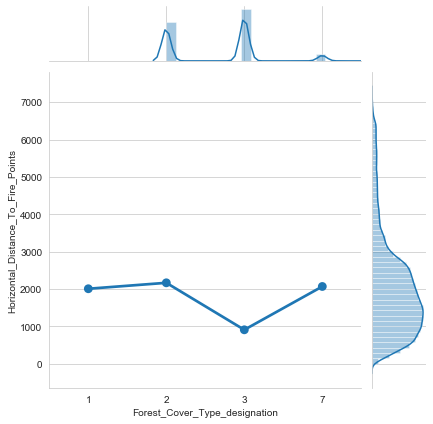

In [0]:
for i in num.columns:
    plt.figure(figsize=(10, 10))
    m = sns.JointGrid(x = "Forest_Cover_Type_designation", y = i, data = df)
    m.plot(sns.pointplot, sns.distplot) # Pointplot - Shows point estimates and confidence intervals as rectangular bars
    plt.show()

#### Observations from Pointplot clearly:

- This shows how good is the `Elevation, Horizontal_Distance_To_Roadways` to classify our Forest Cover Types in their respective classes.

- The worst feature over here are `Vertical_Distance_To_Hydrology, Hillshade_Noon`

<Figure size 720x720 with 0 Axes>

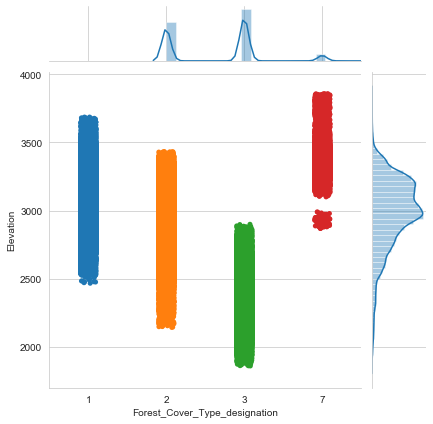

<Figure size 720x720 with 0 Axes>

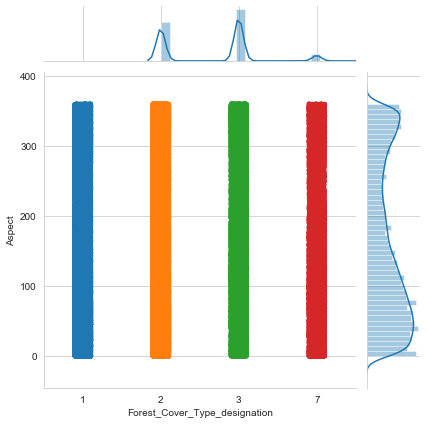

<Figure size 720x720 with 0 Axes>

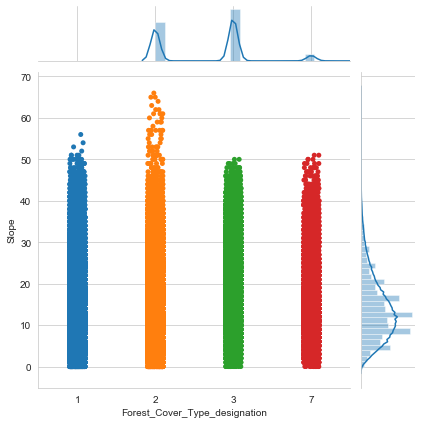

<Figure size 720x720 with 0 Axes>

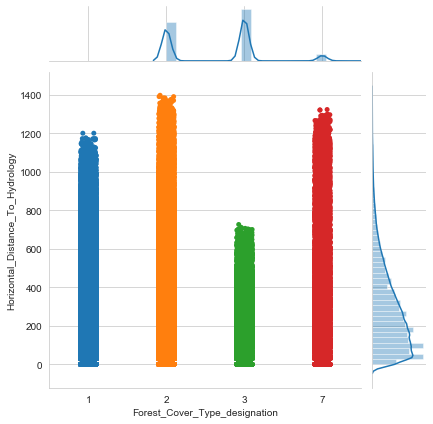

<Figure size 720x720 with 0 Axes>

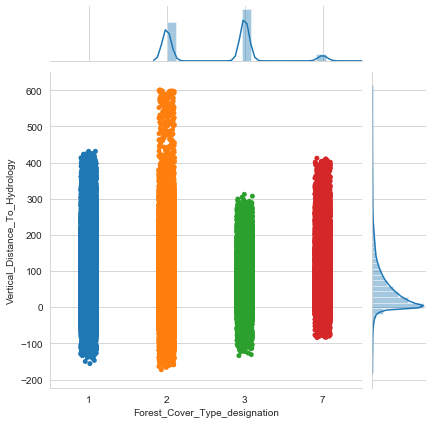

<Figure size 720x720 with 0 Axes>

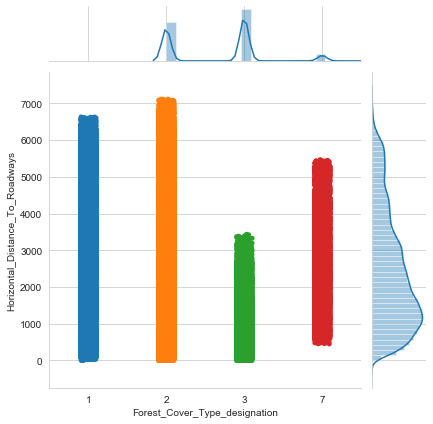

<Figure size 720x720 with 0 Axes>

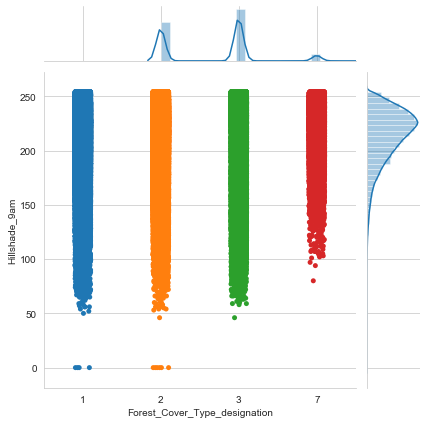

<Figure size 720x720 with 0 Axes>

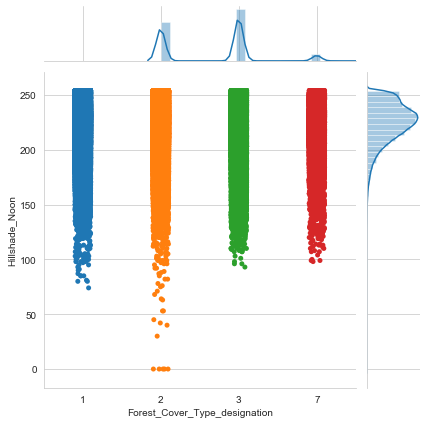

<Figure size 720x720 with 0 Axes>

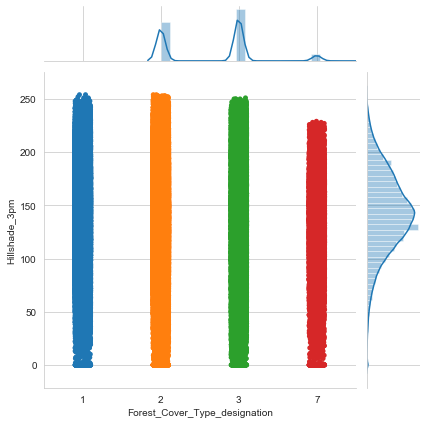

<Figure size 720x720 with 0 Axes>

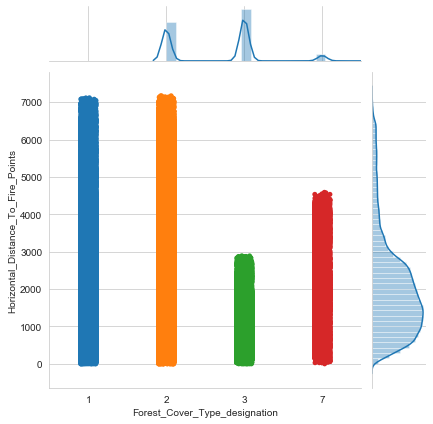

In [0]:
for i in num.columns:
    plt.figure(figsize=(10, 10))
    m = sns.JointGrid(x = "Forest_Cover_Type_designation", y = i, data = df)
    m.plot(sns.stripplot, sns.distplot) # Stripplot - Scatterplot with one categorical variable
    plt.show()

#### Observations from Stripplot clearly:

- According to this plot `Aspect, Hillshade_3pm` also don't seem to be a Good Feature over here.

## IMAGE

<Figure size 720x720 with 0 Axes>

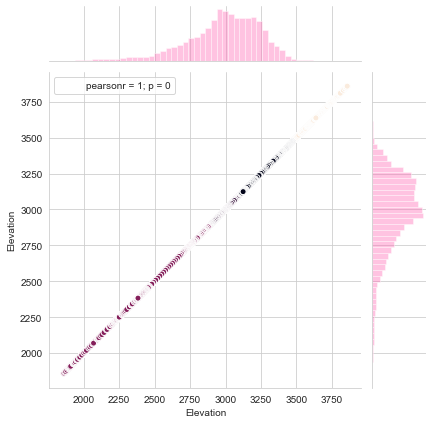

<Figure size 720x720 with 0 Axes>

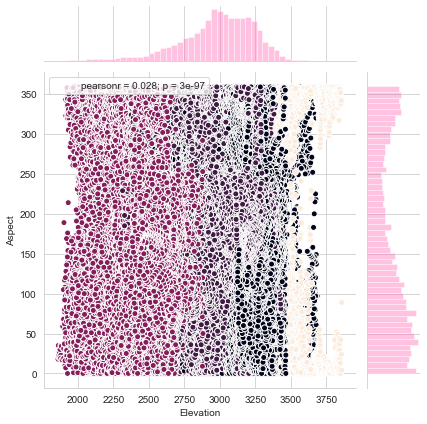

<Figure size 720x720 with 0 Axes>

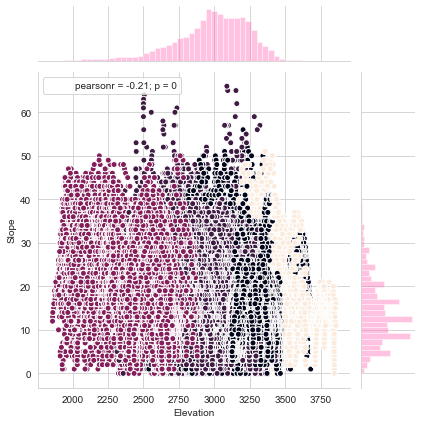

<Figure size 720x720 with 0 Axes>

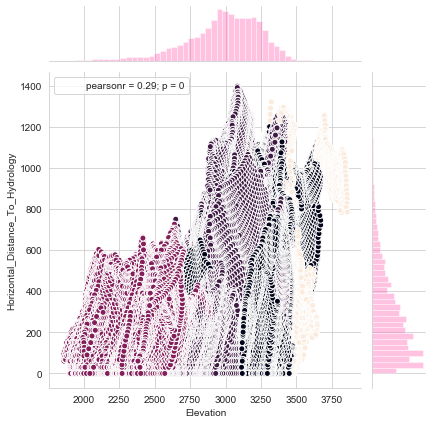

<Figure size 720x720 with 0 Axes>

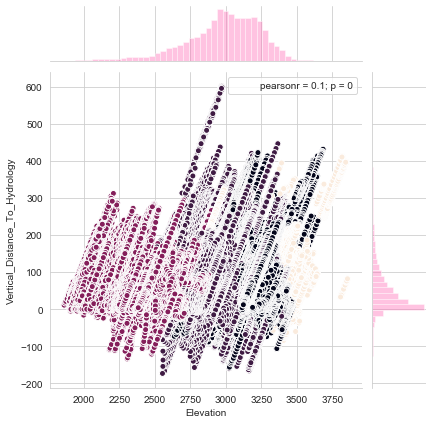

<Figure size 720x720 with 0 Axes>

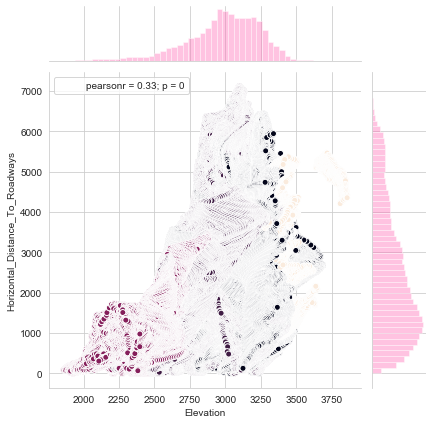

<Figure size 720x720 with 0 Axes>

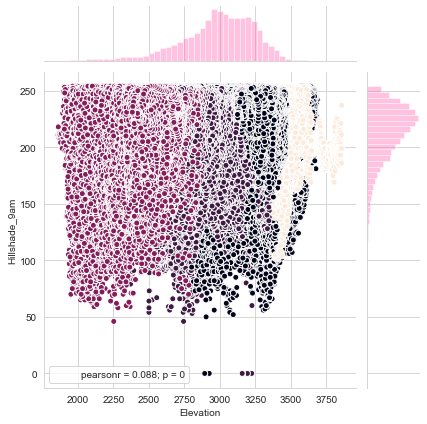

<Figure size 720x720 with 0 Axes>

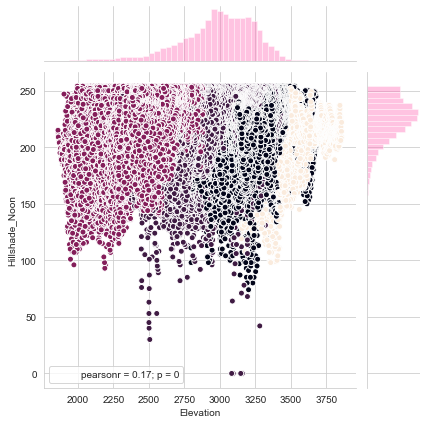

<Figure size 720x720 with 0 Axes>

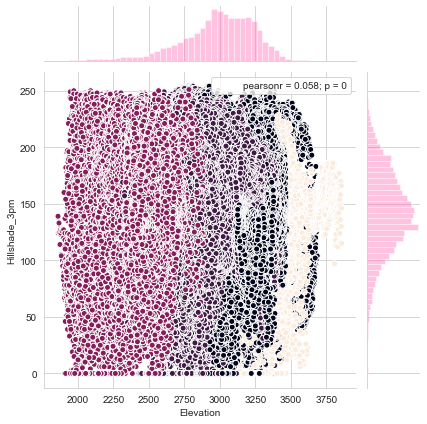

<Figure size 720x720 with 0 Axes>

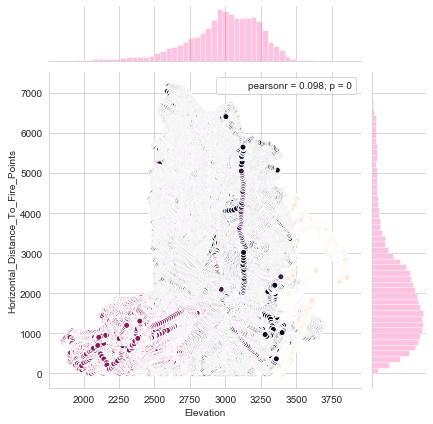

In [0]:
import scipy.stats as stats
for i in num.columns:
    plt.figure(figsize=(10, 10))
    m = sns.JointGrid(x = "Elevation", y = i, data = df)
    #m.plot(sns.scatterplot, sns.boxplot)
    m = m.plot_joint(plt.scatter, c=df['Forest_Cover_Type_designation'], edgecolor="white")
    m = m.plot_marginals(sns.distplot, kde=False, color="hotpink")
    m = m.annotate(stats.pearsonr)
    plt.show()

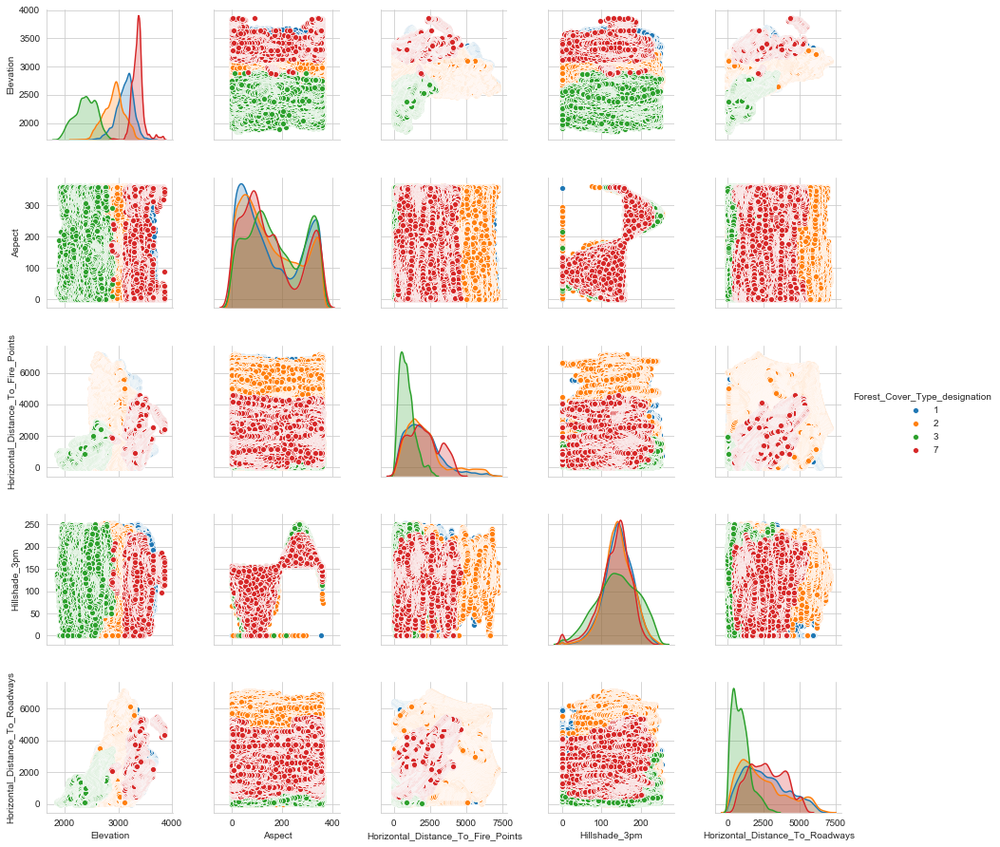

In [0]:
sns.pairplot(df, hue='Forest_Cover_Type_designation' 
             ,vars=['Elevation', 'Aspect', 'Horizontal_Distance_To_Fire_Points' ,'Hillshade_3pm', 'Horizontal_Distance_To_Roadways']
             ,height=2.5,aspect=1)
plt.show()

`'Elevation', 'Aspect', 'Horizontal_Distance_To_Fire_Points' ,'Hillshade_3pm', 'Horizontal_Distance_To_Roadways'` are all the features which upon visual inspection seem to be the best features for our classification problem.

While looking at Pairplots, it seems that the decision boundary cannot be linear. Since, we can see that the decision boundaries formed by the naked eye show parallel decision boundaries. Therefore, tree based models would give better results than any other linear models.

## IMAGE

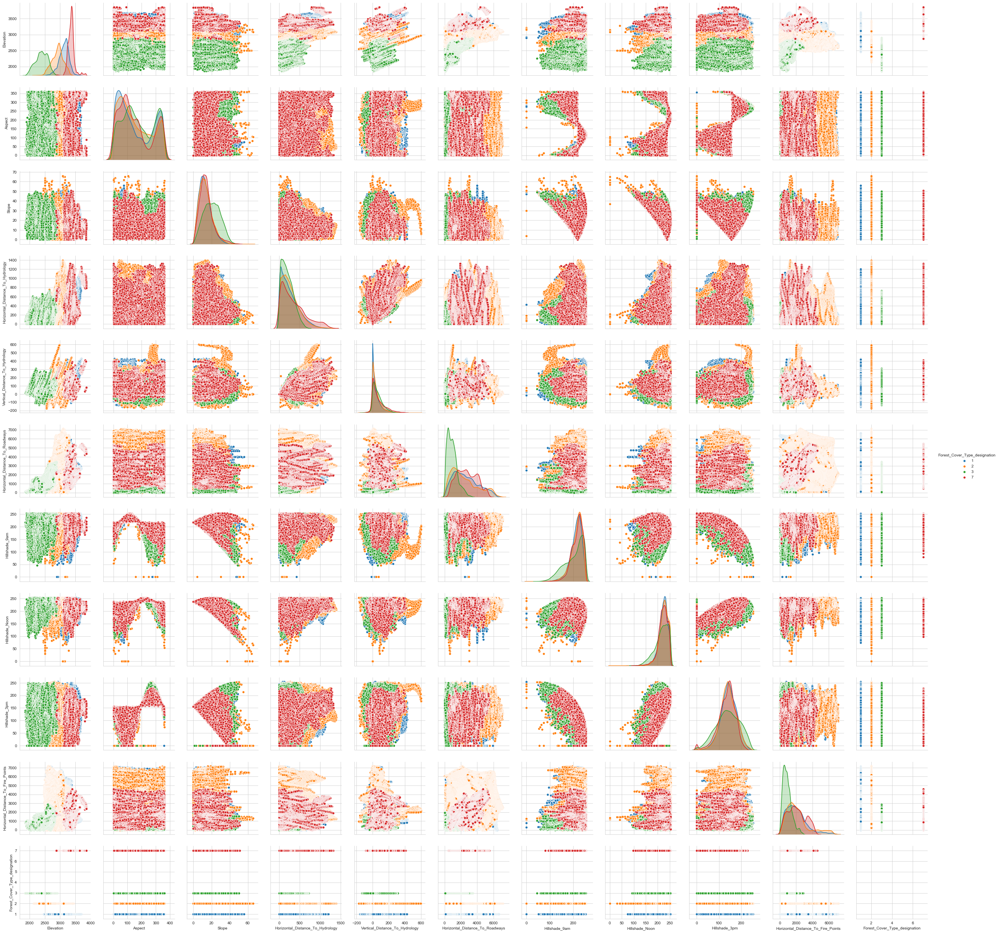

In [0]:
sns.pairplot(df, hue='Forest_Cover_Type_designation',height=3,aspect=1)
#plt.savefig('Pairplots.png', dpi=300)
plt.show()

## IMAGE

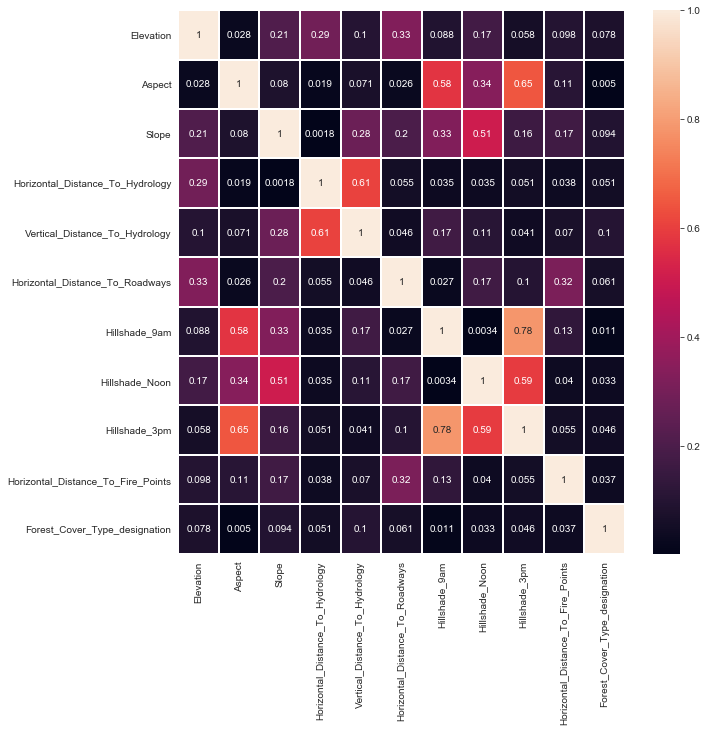

In [0]:
plt.figure(figsize=(10,10))
sns.heatmap(abs(df.corr()), annot=True, linewidths=1)
# plt.savefig('Heatmap1.png', dpi=200)
plt.show()

Since, hillshade indexes are very highly correlated with each other. Let's explore the possiblity of a relationship among them.

## IMAGE

<Figure size 720x720 with 0 Axes>

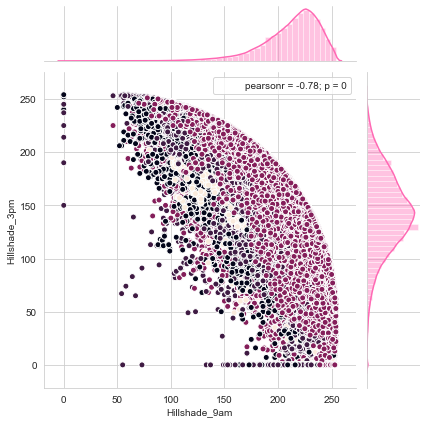

In [0]:
import scipy.stats as stats

plt.figure(figsize=(10, 10))
m = sns.JointGrid(x = "Hillshade_9am", y = 'Hillshade_3pm', data = df)

m = m.plot_joint(plt.scatter, c=df['Forest_Cover_Type_designation'], edgecolor="white")
m = m.plot_marginals(sns.distplot, kde=True, color="hotpink")
m = m.annotate(stats.pearsonr)
#plt.title('Scatter plot for Hillshade_9am v/s Hillshade_3pm')

plt.show()

<Figure size 720x720 with 0 Axes>

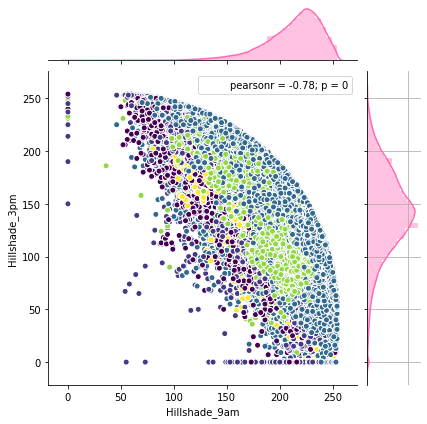

In [0]:
import scipy.stats as stats

plt.figure(figsize=(10, 10))
m = sns.JointGrid(x = "Hillshade_9am", y = 'Hillshade_3pm', data = df)

m = m.plot_joint(plt.scatter, c=df['Forest_Cover_Type_designation'], edgecolor="white")
m = m.plot_marginals(sns.distplot, kde=True, color="hotpink")
m = m.annotate(stats.pearsonr)
#plt.title('Scatter plot for Hillshade_9am v/s Hillshade_3pm')
plt.grid()
plt.show()

Neither of the two Hillshade Indexes have so many 0 values as compared to Hillshade_3pm. When at 3 pm there is sun right above the whole region which logically justifies the amount of 0 values in Hillshade Region.

In [0]:
df.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Forest_Cover_Type_designation',
       'Soil_types', 'Winderness_types'],
      dtype='object')

In [0]:
d = df.select_dtypes(include='object')

for i in d.columns:
    le = LabelEncoder()
    d[i] = le.fit_transform(d[i])
d['Forest_Cover_Type_designation'] = df['Forest_Cover_Type_designation']
d

,Soil_types,Winderness_types,Forest_Cover_Type_designation
2,3,0,2
3,22,0,2
5,20,0,2
11,22,0,2
12,22,0,2
...,...,...,...
581007,10,2,3
581008,10,2,3
581009,10,2,3
581010,10,2,3


Cramers V Corrected Association value for Forest Cover Type v/s Wilderness_types is:  0.425539


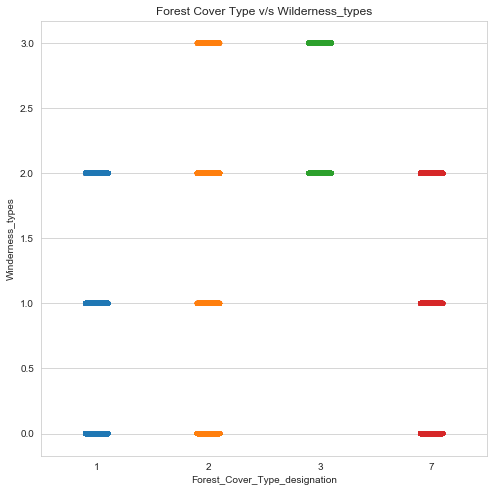

In [0]:
# Plot 1
plt.figure(figsize=(8, 8))
plt.title('Forest Cover Type v/s Wilderness_types')

sns.stripplot(x = "Forest_Cover_Type_designation", y = 'Winderness_types', data = d)


print('Cramers V Corrected Association value for Forest Cover Type v/s Wilderness_types is: ', cramers_v(d['Forest_Cover_Type_designation'], d['Winderness_types']))
plt.show()

<Figure size 720x720 with 0 Axes>

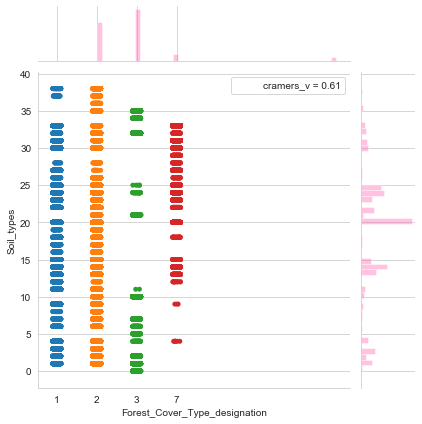

<Figure size 720x720 with 0 Axes>

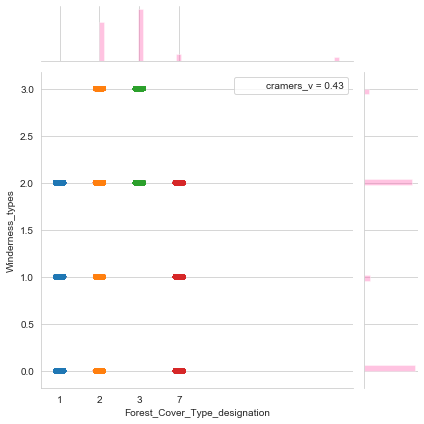

<Figure size 720x720 with 0 Axes>

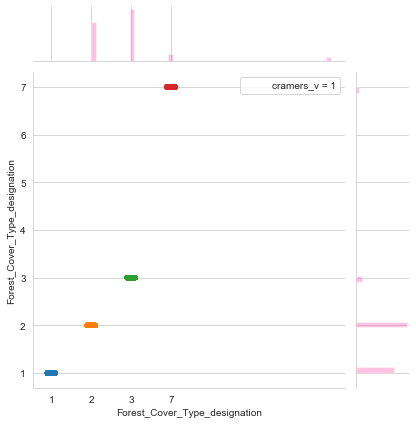

In [0]:
import scipy.stats as stats
for i in d:
    plt.figure(figsize=(10, 10))
    m = sns.JointGrid(x = "Forest_Cover_Type_designation", y = i, data = cat)
    #m.plot(sns.scatterplot, sns.boxplot)
    m = m.plot_joint(sns.stripplot, c=df['Forest_Cover_Type_designation'], edgecolor="white")
    m = m.plot_marginals(sns.distplot, kde=False, color="hotpink")
    m = m.annotate(cramers_v)
    plt.show()

In [0]:
df.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Forest_Cover_Type_designation',
       'Soil_types', 'Winderness_types'],
      dtype='object')

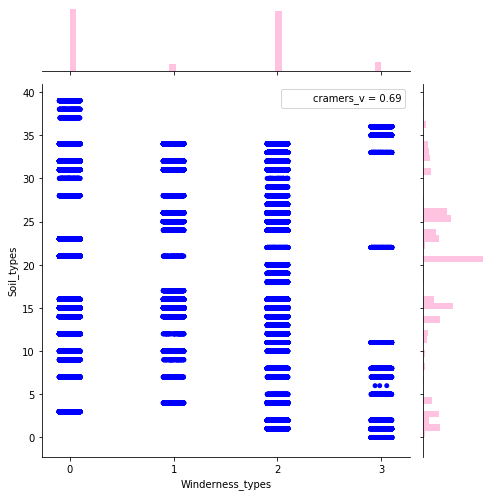

In [0]:
m = sns.JointGrid(x = "Winderness_types", y = 'Soil_types', data = cat, height=7)

m = m.plot_joint(sns.stripplot, color="blue", edgecolor="white")
m = m.plot_marginals(sns.distplot, kde=False, color="hotpink")
m = m.annotate(cramers_v)
plt.show()

In [0]:
df.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Forest_Cover_Type_designation',
       'Soil_types', 'Winderness_types'],
      dtype='object')